# FACTORS THAT CONTRIBUTE TO EMPLOYEE ATTRITION AT IBM

In [1]:
# Import necessary libraries
import pandas as pd
import seaborn as sns
import hvplot
import hvplot.pandas
import statsmodels.api as sm
import matplotlib.pyplot as plt
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls
import plotly.figure_factory as ff

%matplotlib inline
%matplotlib inline
sns.set_style("whitegrid")
plt.style.use("fivethirtyeight")

pd.set_option("display.float_format", "{:.2f}".format)
pd.set_option("display.max_columns", 80)
pd.set_option("display.max_rows", 80)

from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

from sklearn.svm import SVC

from sklearn.metrics import precision_score, roc_auc_score, recall_score, confusion_matrix, roc_curve, precision_recall_curve, accuracy_score, f1_score

from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, cross_val_score, learning_curve, train_test_split
from datetime import datetime
from sklearn.preprocessing import StandardScaler, LabelEncoder

## DATA PREPROCESSING

In [2]:
# Load and display first few rows of the dataset
data = pd.read_csv('IBM.csv')
data.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Y,Yes,11,3,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,Y,No,23,4,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,4,Male,92,2,1,Laboratory Technician,3,Single,2090,2396,6,Y,Yes,15,3,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,4,Female,56,3,1,Research Scientist,3,Married,2909,23159,1,Y,Yes,11,3,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,1,Male,40,3,1,Laboratory Technician,2,Married,3468,16632,9,Y,No,12,3,4,80,1,6,3,3,2,2,2,2


In [3]:
# Summary statistics of the dataset
data.describe()

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00,1470.00
mean,36.92,802.49,9.19,2.91,1.00,1024.87,2.72,65.89,2.73,2.06,2.73,6502.93,14313.10,2.69,15.21,3.15,2.71,80.00,0.79,11.28,2.80,2.76,7.01,4.23,2.19,4.12
std,9.14,403.51,8.11,1.02,0.00,602.02,1.09,20.33,0.71,1.11,1.10,4707.96,7117.79,2.50,3.66,0.36,1.08,0.00,0.85,7.78,1.29,0.71,6.13,3.62,3.22,3.57
min,18.00,102.00,1.00,1.00,1.00,1.00,1.00,30.00,1.00,1.00,1.00,1009.00,2094.00,0.00,11.00,3.00,1.00,80.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00
25%,30.00,465.00,2.00,2.00,1.00,491.25,2.00,48.00,2.00,1.00,2.00,2911.00,8047.00,1.00,12.00,3.00,2.00,80.00,0.00,6.00,2.00,2.00,3.00,2.00,0.00,2.00
50%,36.00,802.00,7.00,3.00,1.00,1020.50,3.00,66.00,3.00,2.00,3.00,4919.00,14235.50,2.00,14.00,3.00,3.00,80.00,1.00,10.00,3.00,3.00,5.00,3.00,1.00,3.00
75%,43.00,1157.00,14.00,4.00,1.00,1555.75,4.00,83.75,3.00,3.00,4.00,8379.00,20461.50,4.00,18.00,3.00,4.00,80.00,1.00,15.00,3.00,3.00,9.00,7.00,3.00,7.00
max,60.00,1499.00,29.00,5.00,1.00,2068.00,4.00,100.00,4.00,5.00,4.00,19999.00,26999.00,9.00,25.00,4.00,4.00,80.00,3.00,40.00,6.00,4.00,40.00,18.00,15.00,17.00


In [4]:
# Check number of rows and Columns
num_rows, num_cols = data.shape
print("Number of rows: ", num_rows)
print("Number of columns: ", num_cols)

Number of rows:  1470
Number of columns:  35


In [5]:
# Print the column names of the DataFrame
print(data.columns)

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')


In [6]:
# Display the summary information of the DataFrame
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

In [7]:
# Check the distribution of target variable
print(data['Attrition'].value_counts())

No     1233
Yes     237
Name: Attrition, dtype: int64


In [8]:
# Extract numeric columns and categorical columns from the DataFrame
numeric_cols = data.select_dtypes(include = ['int64']).columns.tolist()
categorical_cols = data.select_dtypes(include = ['object']).columns.tolist()

In [9]:
# Print the list of numeric columns
print(numeric_cols)

['Age', 'DailyRate', 'DistanceFromHome', 'Education', 'EmployeeCount', 'EmployeeNumber', 'EnvironmentSatisfaction', 'HourlyRate', 'JobInvolvement', 'JobLevel', 'JobSatisfaction', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion', 'YearsWithCurrManager']


In [10]:
# Print the list of categorical columns
print(categorical_cols)

['Attrition', 'BusinessTravel', 'Department', 'EducationField', 'Gender', 'JobRole', 'MaritalStatus', 'Over18', 'OverTime']


In [11]:
# Print unique categorical values for each column
for column in categorical_cols:
    # Get unique values for the column
    unique_values = data[column].unique()
    # Format the values with quotes and join them with ' | '
    formatted_values = ' | '.join(['"' + str(val) + '"' for val in unique_values])
    # Print the column name and the formatted unique values
    print(f"Column: {column}")
    print(f"[{formatted_values}]")
    print("\n")

Column: Attrition
["Yes" | "No"]


Column: BusinessTravel
["Travel_Rarely" | "Travel_Frequently" | "Non-Travel"]


Column: Department
["Sales" | "Research & Development" | "Human Resources"]


Column: EducationField
["Life Sciences" | "Other" | "Medical" | "Marketing" | "Technical Degree" | "Human Resources"]


Column: Gender
["Female" | "Male"]


Column: JobRole
["Sales Executive" | "Research Scientist" | "Laboratory Technician" | "Manufacturing Director" | "Healthcare Representative" | "Manager" | "Sales Representative" | "Research Director" | "Human Resources"]


Column: MaritalStatus
["Single" | "Married" | "Divorced"]


Column: Over18
["Y"]


Column: OverTime
["Yes" | "No"]




In [12]:
    # Print unique numeric values for each column
    for column in numeric_cols:
        # Get unique values for the column
        unique_values = data[column].unique()
        # Format the values with quotes and join them with ' | '
        formatted_values = ' | '.join(['"' + str(val) + '"' for val in unique_values])
        # Print the column name and the formatted unique values
        print(f"Column: {column}")
        print(f"[{formatted_values}]")
        print("\n")

Column: Age
["41" | "49" | "37" | "33" | "27" | "32" | "59" | "30" | "38" | "36" | "35" | "29" | "31" | "34" | "28" | "22" | "53" | "24" | "21" | "42" | "44" | "46" | "39" | "43" | "50" | "26" | "48" | "55" | "45" | "56" | "23" | "51" | "40" | "54" | "58" | "20" | "25" | "19" | "57" | "52" | "47" | "18" | "60"]


Column: DailyRate
["1102" | "279" | "1373" | "1392" | "591" | "1005" | "1324" | "1358" | "216" | "1299" | "809" | "153" | "670" | "1346" | "103" | "1389" | "334" | "1123" | "1219" | "371" | "673" | "1218" | "419" | "391" | "699" | "1282" | "1125" | "691" | "477" | "705" | "924" | "1459" | "125" | "895" | "813" | "1273" | "869" | "890" | "852" | "1141" | "464" | "1240" | "1357" | "994" | "721" | "1360" | "1065" | "408" | "1211" | "1229" | "626" | "1434" | "1488" | "1097" | "1443" | "515" | "853" | "1142" | "655" | "1115" | "427" | "653" | "989" | "1435" | "1223" | "836" | "1195" | "1339" | "664" | "318" | "1225" | "1328" | "1082" | "548" | "132" | "746" | "776" | "193" | "397" 

In [13]:
# Check for missing values
missing_values = data.isnull().sum()
print(missing_values)

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

In [14]:
import pandas as pd
import plotly.graph_objects as go
import plotly.offline as py

# Assuming 'data' is your DataFrame
null_values = pd.DataFrame(len(data) - data.isnull().sum(), columns=['Count'])

# Create a bar chart using Plotly
trace = go.Bar(x=null_values.index, y=null_values['Count'], opacity=0.5,
               marker=dict(color='violet', line=dict(color='#000000', width=1.5)))

layout = dict(title="Missing Values", xaxis=dict(title="Columns"),
              yaxis=dict(title="Missing Values Count"))

fig = dict(data=[trace], layout=layout)
py.iplot(fig)

In [15]:
# Check for duplicate values
print(data.duplicated())
print(data.duplicated().sum())

0       False
1       False
2       False
3       False
4       False
        ...  
1465    False
1466    False
1467    False
1468    False
1469    False
Length: 1470, dtype: bool
0


In [16]:
# check number of unique values in each variable
for column in data.columns:
    print(f"{column}: Number of unique values {data[column].nunique()}")
    print("---------------------------------------------------")

Age: Number of unique values 43
---------------------------------------------------
Attrition: Number of unique values 2
---------------------------------------------------
BusinessTravel: Number of unique values 3
---------------------------------------------------
DailyRate: Number of unique values 886
---------------------------------------------------
Department: Number of unique values 3
---------------------------------------------------
DistanceFromHome: Number of unique values 29
---------------------------------------------------
Education: Number of unique values 5
---------------------------------------------------
EducationField: Number of unique values 6
---------------------------------------------------
EmployeeCount: Number of unique values 1
---------------------------------------------------
EmployeeNumber: Number of unique values 1470
---------------------------------------------------
EnvironmentSatisfaction: Number of unique values 4
-------------------------------

In [17]:
# Drop features with a single number of unique values
data.drop(['EmployeeCount', 'EmployeeNumber', 'Over18', 'StandardHours'], axis="columns", inplace=True)

In [18]:
# Check to confirm unneeded columns have been succesfully dropped
print(data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 31 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EnvironmentSatisfaction   1470 non-null   int64 
 9   Gender                    1470 non-null   object
 10  HourlyRate                1470 non-null   int64 
 11  JobInvolvement            1470 non-null   int64 
 12  JobLevel                  1470 non-null   int64 
 13  JobRole                   1470 non-null   object
 14  JobSatisfaction         

In [19]:
# Descripive statistics for categorical features
object_col = []
for column in data.columns:
    if data[column].dtype == object and len(data[column].unique()) <= 30:
        object_col.append(column)
        print(f"{column} : {data[column].unique()}")
        print(data[column].value_counts())
        print("------------------------------------")
object_col.remove('Attrition')

Attrition : ['Yes' 'No']
No     1233
Yes     237
Name: Attrition, dtype: int64
------------------------------------
BusinessTravel : ['Travel_Rarely' 'Travel_Frequently' 'Non-Travel']
Travel_Rarely        1043
Travel_Frequently     277
Non-Travel            150
Name: BusinessTravel, dtype: int64
------------------------------------
Department : ['Sales' 'Research & Development' 'Human Resources']
Research & Development    961
Sales                     446
Human Resources            63
Name: Department, dtype: int64
------------------------------------
EducationField : ['Life Sciences' 'Other' 'Medical' 'Marketing' 'Technical Degree'
 'Human Resources']
Life Sciences       606
Medical             464
Marketing           159
Technical Degree    132
Other                82
Human Resources      27
Name: EducationField, dtype: int64
------------------------------------
Gender : ['Female' 'Male']
Male      882
Female    588
Name: Gender, dtype: int64
------------------------------------
JobR

<AxesSubplot:xlabel='Age', ylabel='Count'>

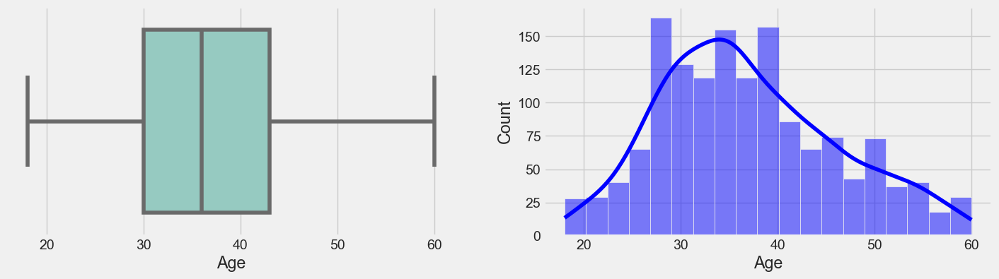

In [20]:
# Create a figure with two subplots side by side
fig, axes = plt.subplots(1, 2, figsize=(16, 4))

# Plot a boxplot on the first subplot
sns.boxplot(ax=axes[0], palette="Set3", x=data['Age'])

# Plot a histogram on the second subplot
sns.histplot(ax=axes[1], color="blue", data=data, x="Age", kde=True)

<AxesSubplot:xlabel='MonthlyIncome', ylabel='Count'>

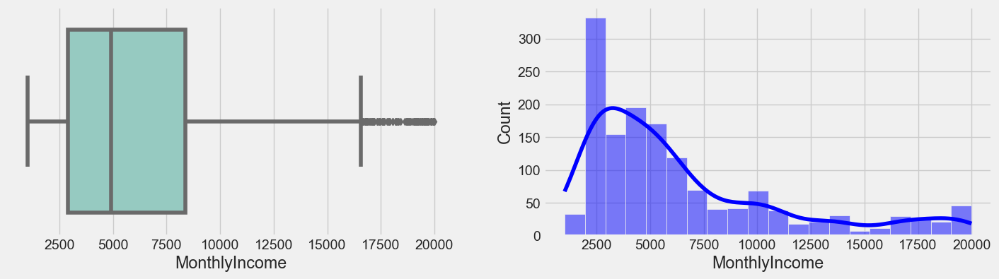

In [21]:
# Create a figure with two subplots side by side
fig, axes = plt.subplots(1, 2, figsize=(16, 4))

# Plot a boxplot on the first subplot
sns.boxplot(ax = axes[0],palette = "Set3", x = data['MonthlyIncome'])

# Plot a histogram on the second subplot
sns.histplot(ax = axes[1],color = "blue",data=data, x="MonthlyIncome", kde=True)

In [22]:
# Count the number of rows in the DataFrame where the 'MonthlyIncome' column is greater than 17500
len(data[data['MonthlyIncome']>17500])

81

In [23]:
df = data[data['MonthlyIncome']<17500]
print(len(df))

1389


<AxesSubplot:xlabel='TotalWorkingYears', ylabel='Count'>

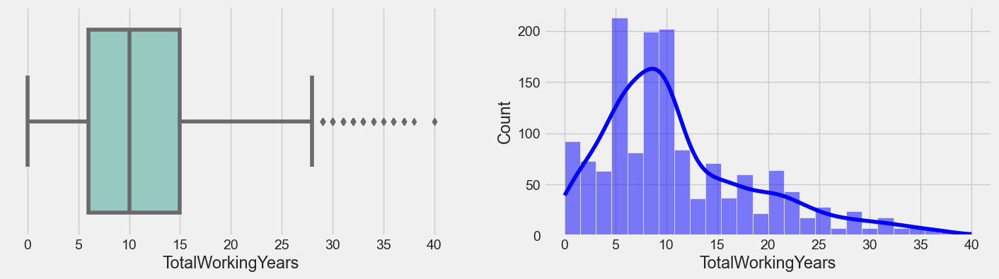

In [24]:
# Create a figure with two subplots side by side
fig, axes = plt.subplots(1, 2, figsize=(16, 4))

# Plot a boxplot on the first subplot
sns.boxplot(ax = axes[0],palette = "Set3", x = data['TotalWorkingYears'])

# Plot a histogram on the second subplot
sns.histplot(ax = axes[1],color = "blue",data=data, x="TotalWorkingYears", kde=True)

In [25]:
# Count the number of rows in the DataFrame where the 'TotalWorkingYears' column is greater than 28
len(data[data['TotalWorkingYears']>28])

63

In [26]:
df = data[data['TotalWorkingYears']<28]
print(len(df))

1393


<AxesSubplot:xlabel='YearsAtCompany', ylabel='Count'>

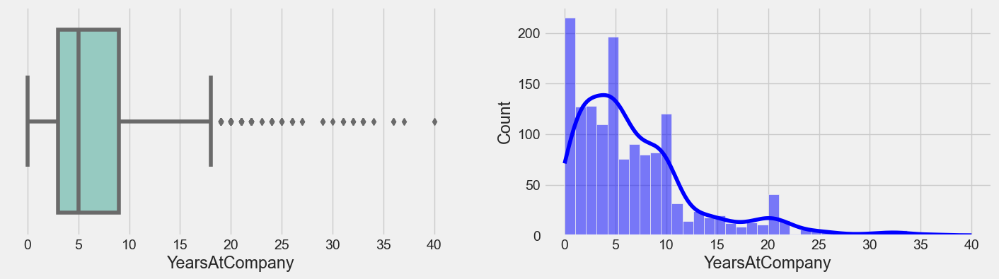

In [27]:
# Create a figure with two subplots side by side
fig, axes = plt.subplots(1, 2, figsize=(16, 4))

# Plot a boxplot on the first subplot
sns.boxplot(ax = axes[0],palette = "Set3", x = data['YearsAtCompany'])

# Plot a histogram on the second subplot
sns.histplot(ax = axes[1],color = "blue",data=data, x="YearsAtCompany", kde=True)

In [28]:
# Count the number of rows in the DataFrame where the 'YearsAtCompany' column is greater than 18
len(data[data['YearsAtCompany']>18])

104

In [29]:
df = data[data['YearsAtCompany']<18]
print(len(df))

1353


<AxesSubplot:xlabel='YearsSinceLastPromotion', ylabel='Count'>

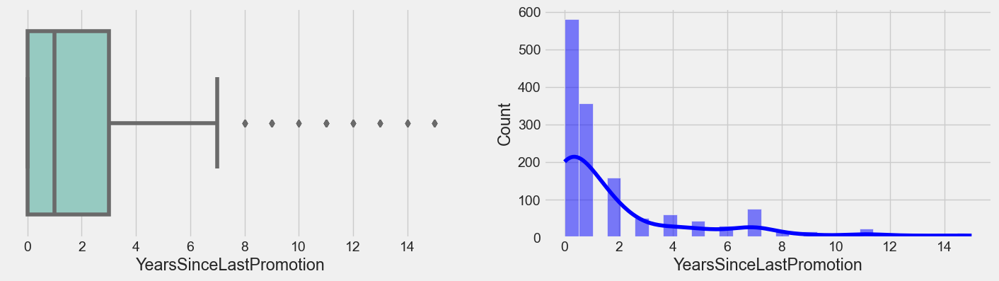

In [30]:
# Create a figure with two subplots side by side
fig, axes = plt.subplots(1, 2, figsize=(16, 4))

# Plot a boxplot on the first subplot
sns.boxplot(ax = axes[0],palette = "Set3", x = data['YearsSinceLastPromotion'])

# Plot a histogram on the second subplot
sns.histplot(ax = axes[1],color = "blue",data=data, x="YearsSinceLastPromotion", kde=True)

In [31]:
# Count the number of rows in the DataFrame where the 'YearsSinceLastPromotion' column is greater than 7
len(data[data['YearsSinceLastPromotion']>7])

107

In [32]:
# # Create new DataFrame called 'df' by filtering the 'data' DataFrame
df = data[data['YearsSinceLastPromotion']<7]
print(len(df))

1287


## DATA VISUALIZATION

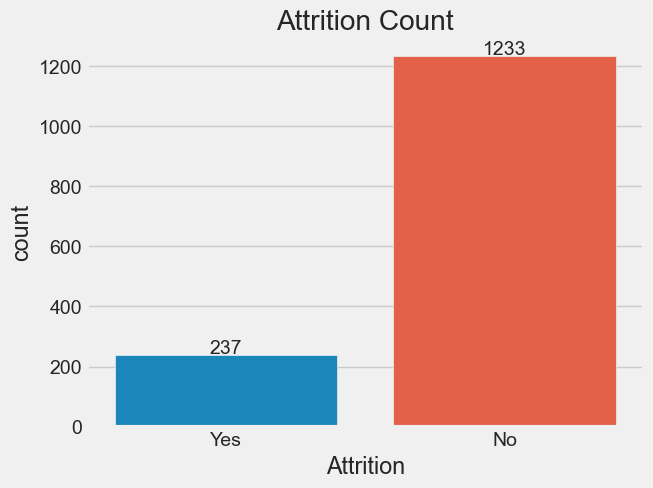

In [33]:
# Count plot of 'Attrition'
ax = sns.countplot(data=data, x='Attrition')

# Set the alpha and color values
alpha_value = 1.0  # Adjust alpha (transparency) value as needed (0.0 to 1.0, where 0.0 is fully transparent and 1.0 is fully opaque)

# Display the count values on the plot
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.0f'), (p.get_x() + p.get_width() / 2., p.get_height()), ha = 'center', va = 'center', xytext = (0, 5), textcoords = 'offset points')

plt.title('Attrition Count')
plt.savefig('attrition_count.png', dpi=300)  # Adjust the dpi value as needed
plt.xticks(rotation=0)
plt.show()

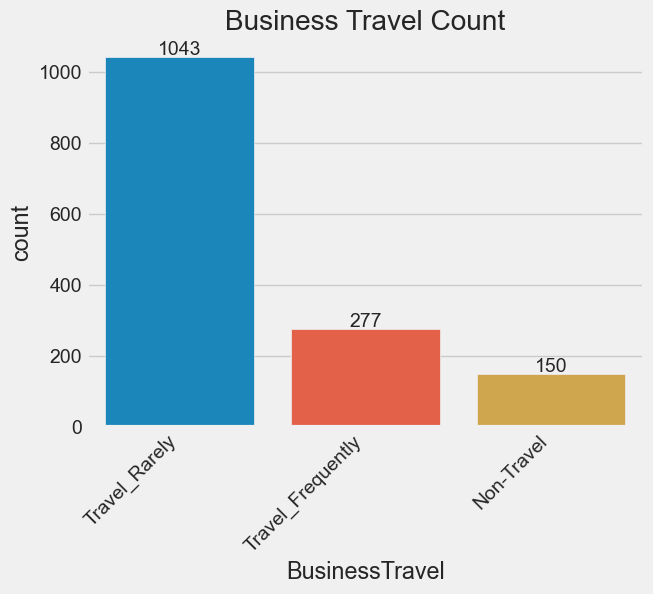

In [34]:
# Count plot of 'Business Travel'
ax = sns.countplot(data=data, x='BusinessTravel')

# Display the count values on the plot
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.0f'), (p.get_x() + p.get_width() / 2., p.get_height()), ha = 'center', va = 'center', xytext = (0, 5), textcoords = 'offset points')

plt.title('Business Travel Count')
plt.savefig('business_travel.png', dpi=300)  # Adjust the dpi value as needed
plt.xticks(rotation=45, ha = 'right')
plt.show()

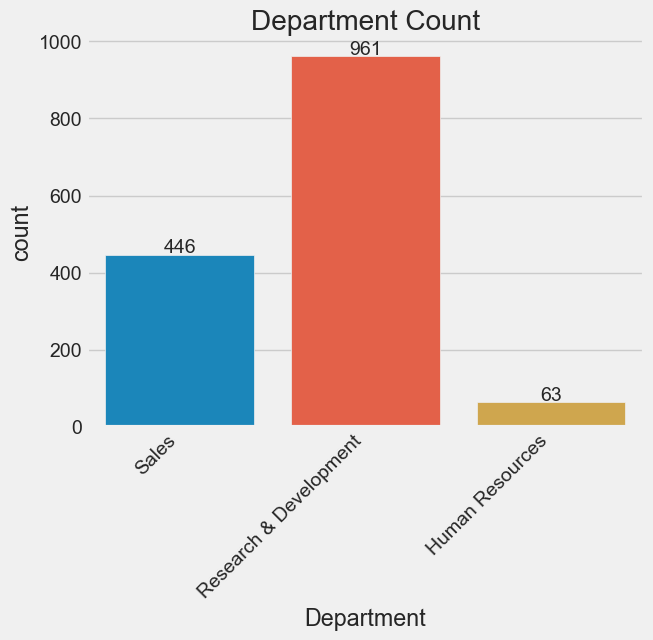

In [35]:
# Count plot of 'Department'
ax = sns.countplot(data=data, x='Department')

# Display the count values on the plot
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.0f'), (p.get_x() + p.get_width() / 2., p.get_height()), ha = 'center', va = 'center', xytext = (0,5), textcoords = 'offset points')

plt.title('Department Count')
plt.savefig('department_count.png', dpi=300)  # Adjust the dpi value as needed
plt.xticks(rotation=45, ha = 'right')
plt.show()

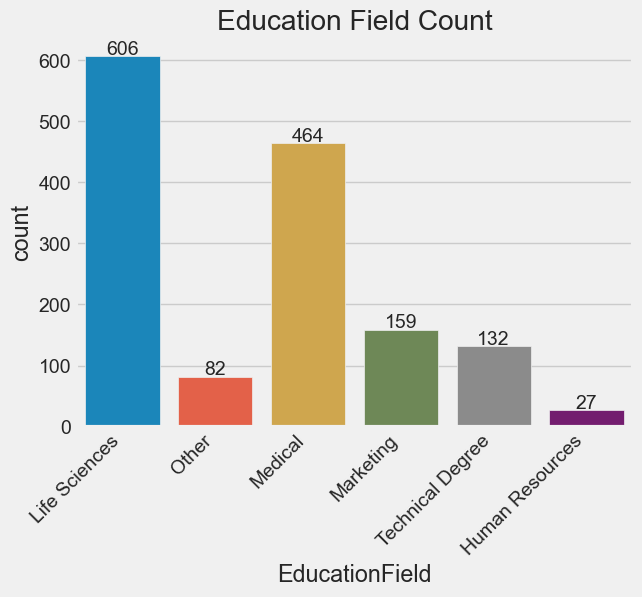

In [36]:
# Count plot of 'Education Field'
ax = sns.countplot(data=data, x='EducationField')

# Display the count values on the plot
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.0f'), (p.get_x() + p.get_width() / 2., p.get_height()), ha = 'center', va = 'center', xytext = (0, 5), textcoords = 'offset points')

plt.title('Education Field Count')
plt.savefig('education_field_count.png', dpi=300)  # Adjust the dpi value as needed
plt.xticks(rotation=45, ha = 'right')
plt.show()

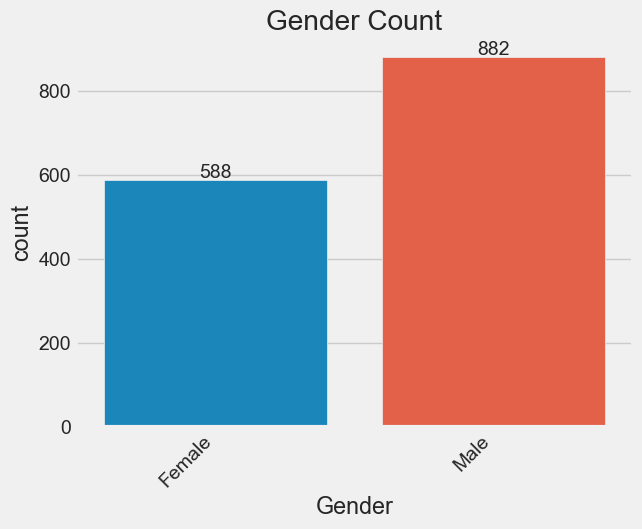

In [37]:
# Count plot of 'Gender'
ax = sns.countplot(data=data, x='Gender')

# Display the count values on the plot
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.0f'), (p.get_x() + p.get_width() / 2., p.get_height()), ha = 'center', va = 'center', xytext = (0, 5), textcoords = 'offset points')

plt.title('Gender Count')
plt.savefig('gender_count.png', dpi=300)  # Adjust the dpi value as needed
plt.xticks(rotation=45, ha = 'right')
plt.show()

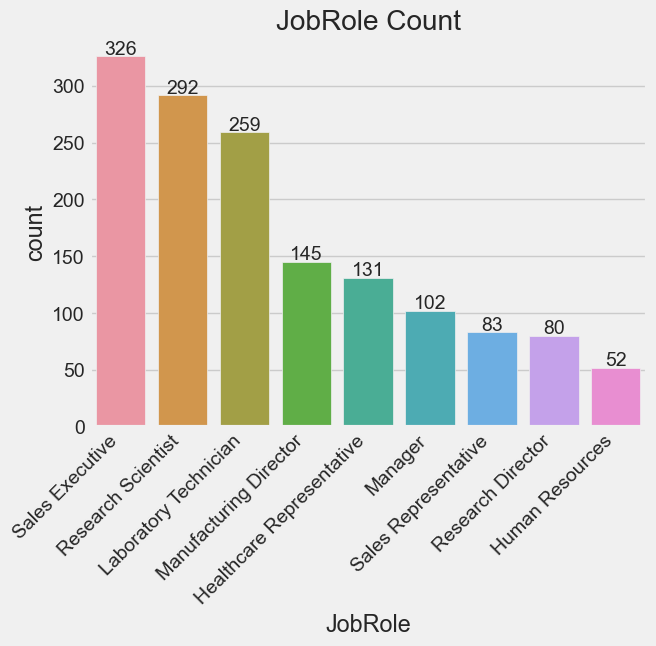

In [38]:
# Count plot of 'Gender'
ax = sns.countplot(data=data, x='JobRole')

# Display the count values on the plot
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.0f'), (p.get_x() + p.get_width() / 2., p.get_height()), ha = 'center', va = 'center', xytext = (0, 5), textcoords = 'offset points')

plt.title('JobRole Count')
plt.savefig('JobRole_count.png', dpi=300)  # Adjust the dpi value as needed
plt.xticks(rotation=45, ha = 'right')
plt.show()

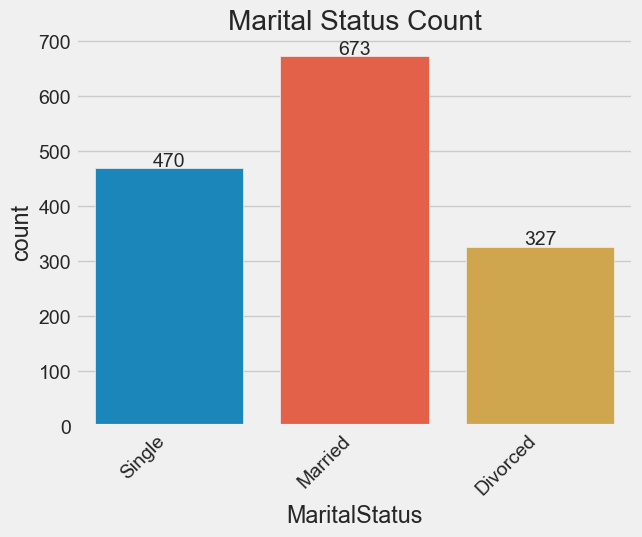

In [39]:
# Count plot of 'Marital Status'
ax = sns.countplot(data=data, x='MaritalStatus')

# Display the count values on the plot
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.0f'), (p.get_x() + p.get_width() / 2., p.get_height()), ha = 'center', va = 'center', xytext = (0, 5), textcoords = 'offset points')

plt.title('Marital Status Count')
plt.savefig('marital_status_count.png', dpi=300)  # Adjust the dpi value as needed
plt.xticks(rotation=45, ha = 'right')
plt.show()

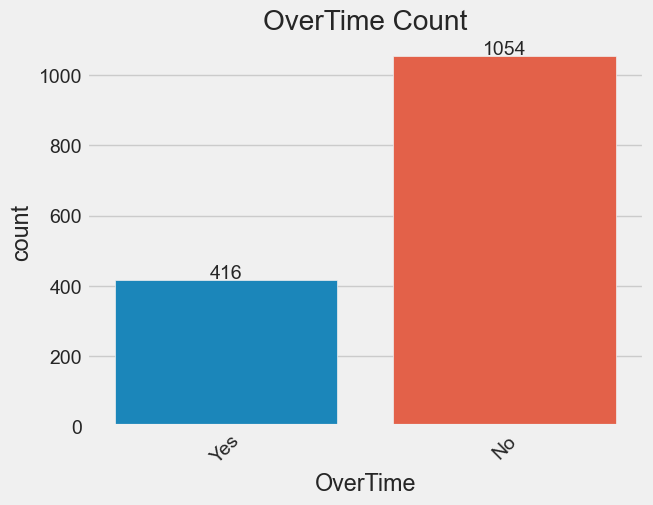

In [40]:
# Count plot of 'Over Time'
ax = sns.countplot(data=data, x='OverTime')

# Display the count values on the plot
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.0f'), (p.get_x() + p.get_width() / 2., p.get_height()), ha = 'center', va = 'center', xytext = (0, 5), textcoords = 'offset points')

plt.title('OverTime Count')
plt.savefig('over_time_count.png', dpi=300)  # Adjust the dpi value as needed
plt.xticks(rotation=45)
plt.show()

In [41]:
# Label Encoding

In [42]:
# Attrition
data['Attrition'].replace('Yes', 1, inplace=True)
data['Attrition'].replace('No', 0, inplace=True)

In [43]:
from sklearn.preprocessing import LabelEncoder

# Select only the categorical columns to encode
categorical_columns = ['JobRole', 'Department', 'BusinessTravel', 'EducationField', 'Gender', 'MaritalStatus', 'OverTime']

label_encoder = LabelEncoder()
data[categorical_columns] = data[categorical_columns].apply(label_encoder.fit_transform)

In [44]:
# Specified variable Versus Attrition

In [45]:
# Age vs Attrition

data.hvplot.hist(y='Age', by='Attrition', subplots=False, width=600, height=300, bins=30)

# Workers in age range of 18yrs - 33yrs are more likely to quit their jobs 

:NdOverlay   [Attrition]
   :Histogram   [Age]   (Age_count)

In [46]:
# JobLevel vs Attrition

data.hvplot.hist(y='JobLevel', by='Attrition', subplots=False, width=600, height=300, bins=30)

# Workers with low Job Level are more likely to quit their jobs 

:NdOverlay   [Attrition]
   :Histogram   [JobLevel]   (JobLevel_count)

In [47]:
# MonthlyIncome vs Attrition

data.hvplot.hist(y='MonthlyIncome', by='Attrition', subplots=False, width=600, height=300, bins=30)

# Workers with low MonthlyIncome are more likely to quit their jobs

:NdOverlay   [Attrition]
   :Histogram   [MonthlyIncome]   (MonthlyIncome_count)

In [48]:
# YearsAtCompany vs Attrition
data.hvplot.hist(y='YearsAtCompany', by='Attrition', subplots=False, width=600, height=300, bins=30)

# Workers with least number of years at IBM are more likely to quit their jobs

:NdOverlay   [Attrition]
   :Histogram   [YearsAtCompany]   (YearsAtCompany_count)

In [49]:
# TotalWorkingYears vs Attrition

data.hvplot.hist(y='TotalWorkingYears', by='Attrition', subplots=False, width=600, height=300, bins=30)

# workers with low number of total working years more likely to quit

:NdOverlay   [Attrition]
   :Histogram   [TotalWorkingYears]   (TotalWorkingYears_count)

In [50]:
# NumCompaniesWorked vs Attrition

data.hvplot.hist(y='NumCompaniesWorked', by='Attrition', subplots=False, width=600, height=300, bins=30)

# workers that have worked for a high number of companies are more likely to quit

:NdOverlay   [Attrition]
   :Histogram   [NumCompaniesWorked]   (NumCompaniesWorked_count)

In [51]:
# EnvironmentSatisfaction vs Attrition

data.hvplot.hist(y='EnvironmentSatisfaction', by='Attrition', subplots=False, width=600, height=300, bins=30)

# Seems Environment Satisfaction has no significant impact in determining attrition

:NdOverlay   [Attrition]
   :Histogram   [EnvironmentSatisfaction]   (EnvironmentSatisfaction_count)

In [52]:
# JobSatisfaction vs Attrition

data.hvplot.hist(y='JobSatisfaction', by='Attrition', subplots=False, width=600, height=300, bins=30)

# Looks like Job satisfaction has no big impact in determining attrition

:NdOverlay   [Attrition]
   :Histogram   [JobSatisfaction]   (JobSatisfaction_count)

In [53]:
# PerformanceRating vs Attrition

data.hvplot.hist(y='PerformanceRating', by='Attrition', subplots=False, width=600, height=300, bins=30)

# seems Performance rating has no big impact in determining attrition

:NdOverlay   [Attrition]
   :Histogram   [PerformanceRating]   (PerformanceRating_count)

In [54]:
# RelationshipSatisfaction vs Attrition

data.hvplot.hist(y='RelationshipSatisfaction', by='Attrition', subplots=False, width=600, height=300, bins=30)

# Relationship satisfaction seemingly has no big impact in determining attrition

:NdOverlay   [Attrition]
   :Histogram   [RelationshipSatisfaction]   (RelationshipSatisfaction_count)

In [55]:
# Department vs Attrition - Human Resources = 1, Research and development = 2,  Sales = 3

data.hvplot.hist(y='Department', by='Attrition', subplots=False, width=600, height=300, bins=30)

# Workers in Research and Development department (2) more likely to stay

:NdOverlay   [Attrition]
   :Histogram   [Department]   (Department_count)

In [56]:
# BusinessTravel vs Attrition - Non-travel = 1, Travel Rarely = 2, Travel Frequently = 3

data.hvplot.hist(y='BusinessTravel', by='Attrition', subplots=False, width=600, height=300, bins=30)

# Workers who rarely travel are more likely to stay at their jobs.

:NdOverlay   [Attrition]
   :Histogram   [BusinessTravel]   (BusinessTravel_count)

In [57]:
# EducationField vs Attrition - HR = 1, Sciences = 2, Marketing = 3, Medical = 4, Other = 5, Tech Degree = 6

data.hvplot.hist(y='EducationField', by='Attrition', subplots=False, width=600, height=300, bins=30)

# workers in HR field (1) and Technical Degree (6) are more likely to quit

:NdOverlay   [Attrition]
   :Histogram   [EducationField]   (EducationField_count)

In [58]:
# Education vs Attrition

data.hvplot.hist(y='Education', by='Attrition', subplots=False, width=600, height=300, bins=30)

# Workers with lower level of education are more likely to leave the company

:NdOverlay   [Attrition]
   :Histogram   [Education]   (Education_count)

In [59]:
# DistanceFromHome vs Attrition

data.hvplot.hist(y='DistanceFromHome', by='Attrition', subplots=False, width=600, height=300, bins=30)

# Workers that stay a distance from the office are more likely to quit

:NdOverlay   [Attrition]
   :Histogram   [DistanceFromHome]   (DistanceFromHome_count)

In [60]:
# Gender vs Attrition - Female = 0, Male = 1

data.hvplot.hist(y='Gender', by='Attrition', subplots=False, width=600, height=300, bins=30)

# Male employees are more likely to quit compared to Female employees

:NdOverlay   [Attrition]
   :Histogram   [Gender]   (Gender_count)

In [61]:
# MaritalStatus vs Attrition - Divorced = 0, Married = 1, Single = 2

data.hvplot.hist(y='MaritalStatus', by='Attrition', subplots=False, width=600, height=300, bins=30)

# Single workers are more likely to quit than the Married and Divorced

:NdOverlay   [Attrition]
   :Histogram   [MaritalStatus]   (MaritalStatus_count)

In [62]:
# OverTime vs Attrition - Overtime = 1, No Overtime = 2

data.hvplot.hist(y='OverTime', by='Attrition', subplots=False, width=600, height=300, bins=30)

# Workers who work extra hours are more likely to quit

:NdOverlay   [Attrition]
   :Histogram   [OverTime]   (OverTime_count)

### Correlation Matrix

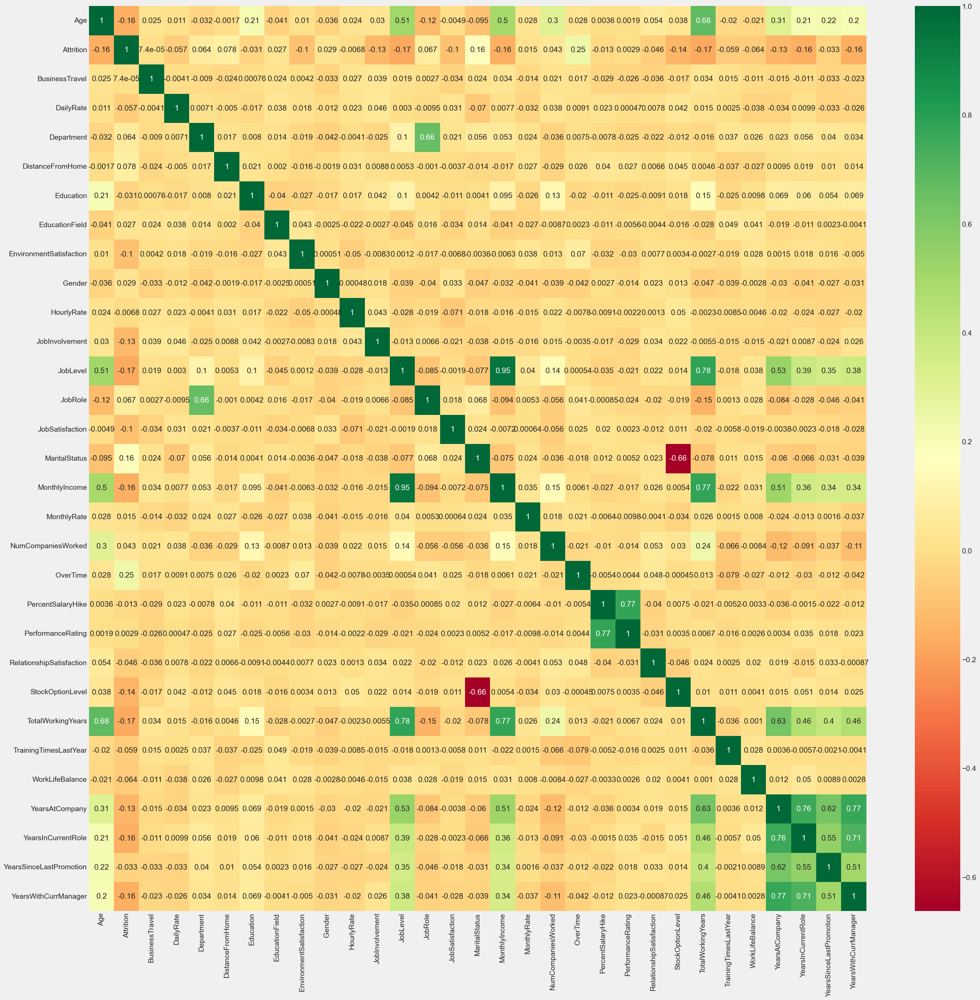

In [63]:
plt.figure(figsize=(30, 30))
sns.heatmap(data.corr(), annot=True, cmap="RdYlGn", annot_kws={"size":15})
plt.savefig('correlation_matrix.png', dpi=300)  # Adjust the dpi value as needed

# Positive correlation (0.95) between "Job Level" and "monthly income"
# Positive correlation (0.78) between "total working years" and "job level"
# Positive correlation (0.77) between "total working years" and "monthly income"
# Positive correlation (0.77) between "Percent Salary Hike" and "Performance Rating"
# Positive correlation (0.77) between "Years at Company" and "Years with Current Manager" 

# Negative Correlation (-0.66) between "Marital Status" and "Stock Pile Option"
# Negative Correlation (-0.17) between "Attrition" and "Job Level" and "Total Working Years"
# Negative Correlation (-0.17) between "Attrition" and "Age" and "Monthly Income", "Years in  Current Role" and "Years With Current Manager"

# No Correlation/Zero Correlation (0.000470) between "Daily Rate" and "Performance Rating"

### Correlation Matrix of Features against Attirtion

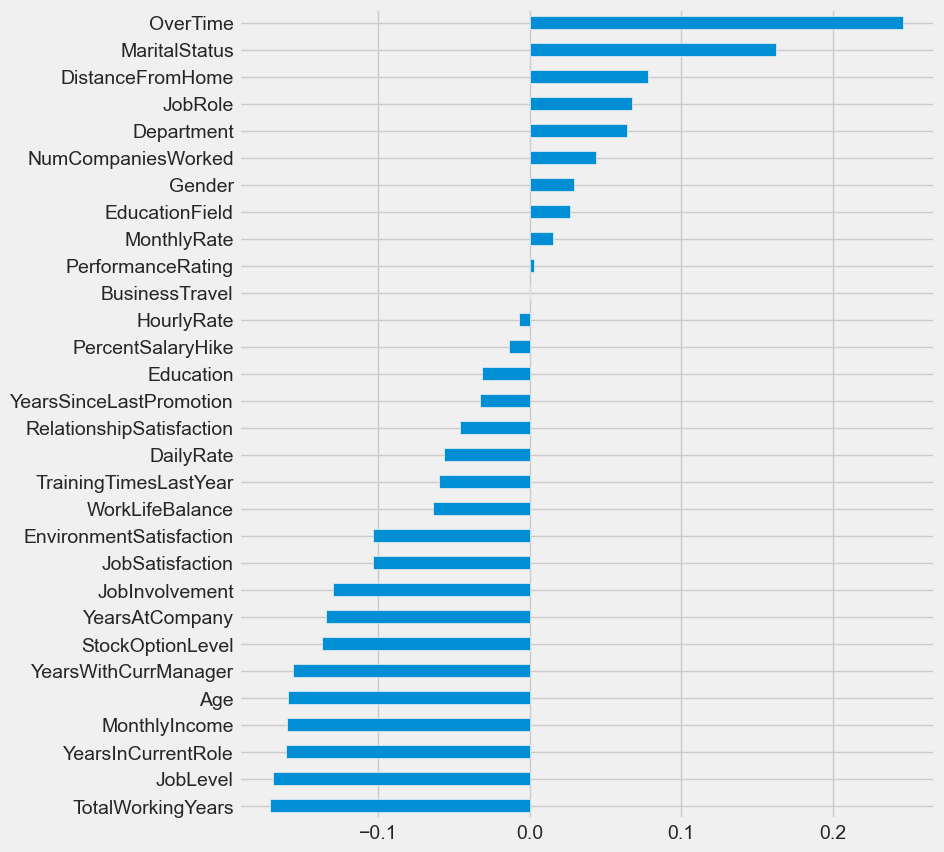

In [64]:
correlations = data.drop('Attrition', axis=1).corrwith(data['Attrition'])
# Sort the correlations
sorted_correlations = correlations.sort_values()

# Create the figure and plot
plt.figure(figsize=(8, 10))
sorted_correlations.plot(kind='barh')

# Display the plot
plt.show()

# "OverTime" and "Marital Status" are highly positively correlated with Attrition
# "Performance Rating" and "Monthly Rate" are lowly postively correlated with Attrition
# "Total Working Years", "Job Level", "Years in current role", "Monthly Income, "Age" and "Years with current manager" are highly negatively correlated with Attrition
# "Business" Travel has no correlation or Zero correlation with Attrition



## DATA ANALYSIS AND MODEL SELECTION

In [65]:
# Separate the features (X) and the target variable (y)
X = data.drop('Attrition', axis=1)
y = data.Attrition

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

In [66]:
def feature_imp(df, model):
    ftr_imp = pd.DataFrame()  # Create an empty DataFrame
    ftr_imp["feature"] = df.columns  # Assign column names of the input DataFrame to "feature" column
    ftr_imp["importance"] = model.feature_importances_  # Assign feature importances from the model to "importance" column
    return ftr_imp.sort_values(by="importance", ascending=true)  # Sort the DataFrame by "importance" column in Ascending order

## LOGISTIC REGRESSION

Classification report:
               precision    recall  f1-score   support

           0      0.889     0.972     0.928       247
           1      0.708     0.362     0.479        47

    accuracy                          0.874       294
   macro avg      0.799     0.667     0.704       294
weighted avg      0.860     0.874     0.857       294

Confusion Matrix:
 [[240   7]
 [ 30  17]]


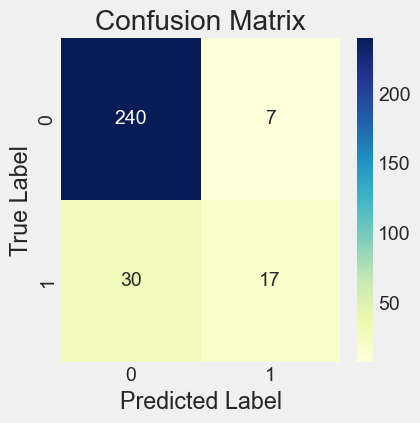

In [67]:
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Set a fixed random seed
np.random.seed(42)

lgr_model = LogisticRegression(solver='liblinear', penalty='l1')
lgr_model.fit(X_train, y_train)

# Make predictions on the test data
y_predlgr = lgr_model.predict(X_test)

# Calculate classification report
report_lgr = classification_report(y_test, y_predlgr, digits=3)
print("Classification report:\n", report_lgr)

# Generate confusion matrix
cmf_mtx = confusion_matrix(y_test, y_predlgr)

# Print confusion matrix
print("Confusion Matrix:\n", cmf_mtx)

plt.figure(figsize=(4, 4))  # Set the figure size to your desired dimensions
sns.heatmap(cmf_mtx, annot=True, cmap="YlGnBu", fmt='d')  # Use 'd' instead of 'g' to display integer values
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

### PLOT FEATURE IMPORTANCE

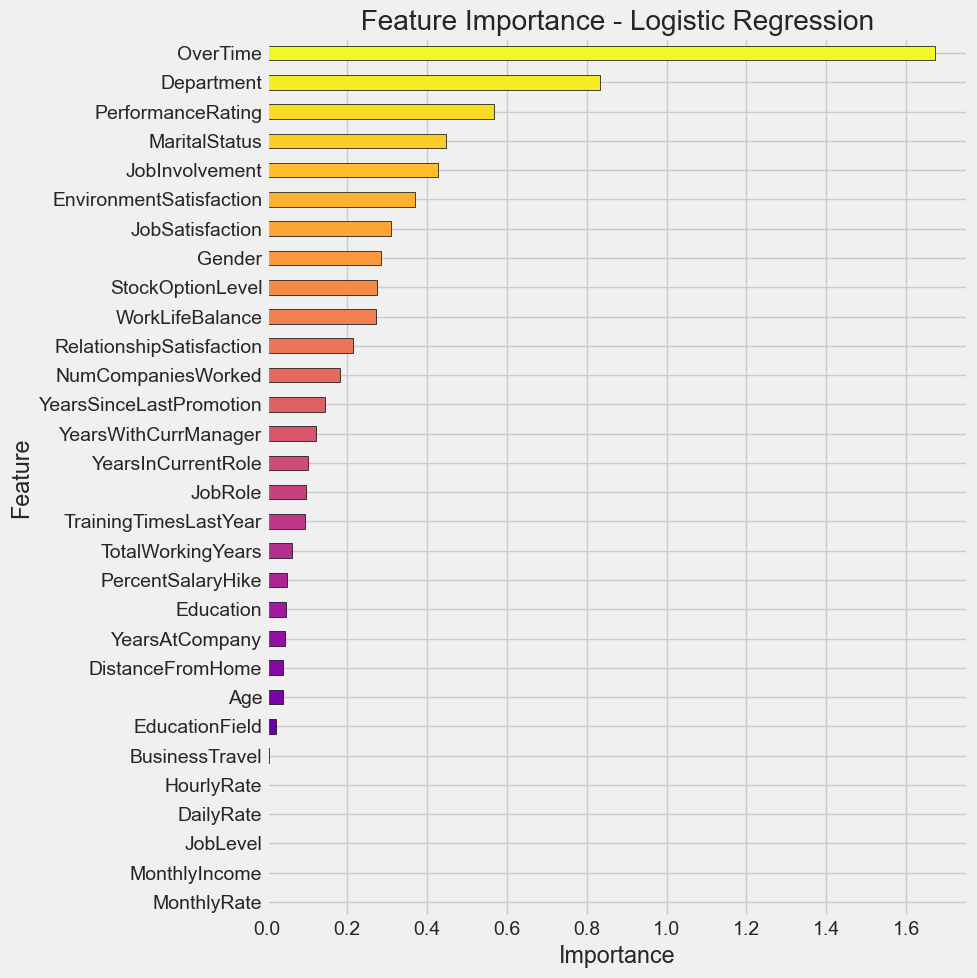

In [68]:
import pandas as pd
import numpy as np

# Get feature coefficients
df = pd.DataFrame()
df['feature'] = X.columns
df['coefficient'] = np.abs(lgr_model.coef_[0])  # Get absolute values of coefficients for importance

# Sort the DataFrame by importance in descending order
df_sorted = df.sort_values(by='coefficient', ascending=True)

# Reset the index to use the default numeric index
df_sorted.reset_index(drop=True, inplace=True)

# Use 'plasma' colormap for bar colors
bar_colors = plt.cm.plasma(np.linspace(0, 1, len(df_sorted)))

plt.figure(figsize=(10, 10))  # Adjust the figure size

# Plot the feature importance
ax = df_sorted['coefficient'].plot(kind='barh', color=bar_colors, edgecolor='black')

# Set y-tick labels to the feature names
ax.set_yticks(range(len(df_sorted)))
ax.set_yticklabels(df_sorted['feature'])

plt.title(' Feature Importance - Logistic Regression ')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.tight_layout()  # Adjust the spacing
plt.show()

## RANDOM FOREST

Classification report:
               precision    recall  f1-score   support

           0      0.855     0.980     0.913       247
           1      0.545     0.128     0.207        47

    accuracy                          0.844       294
   macro avg      0.700     0.554     0.560       294
weighted avg      0.806     0.844     0.800       294

Confusion Matrix:
 [[242   5]
 [ 41   6]]


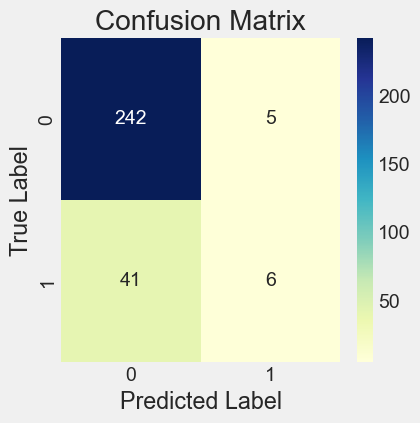

In [69]:
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Set a fixed random seed
np.random.seed(42)

rf_model = RandomForestClassifier(n_estimators=100)
rf_model.fit(X_train, y_train)

# Make predictions on the test data
y_pred_rf = rf_model.predict(X_test)

# Calculate classification report
report_rf = classification_report(y_test, y_pred_rf, digits=3)
print("Classification report:\n", report_rf)

# Generate confusion matrix
cmf_mtx_rf = confusion_matrix(y_test, y_pred_rf)

# Print confusion matrix
print("Confusion Matrix:\n", cmf_mtx_rf)

plt.figure(figsize=(4, 4))  # Set the figure size to your desired dimensions
sns.heatmap(cmf_mtx_rf, annot=True, cmap="YlGnBu", fmt='d')  # Use 'd' instead of 'g' to display integer values
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

### PLOT FEATURE IMPORTANCE

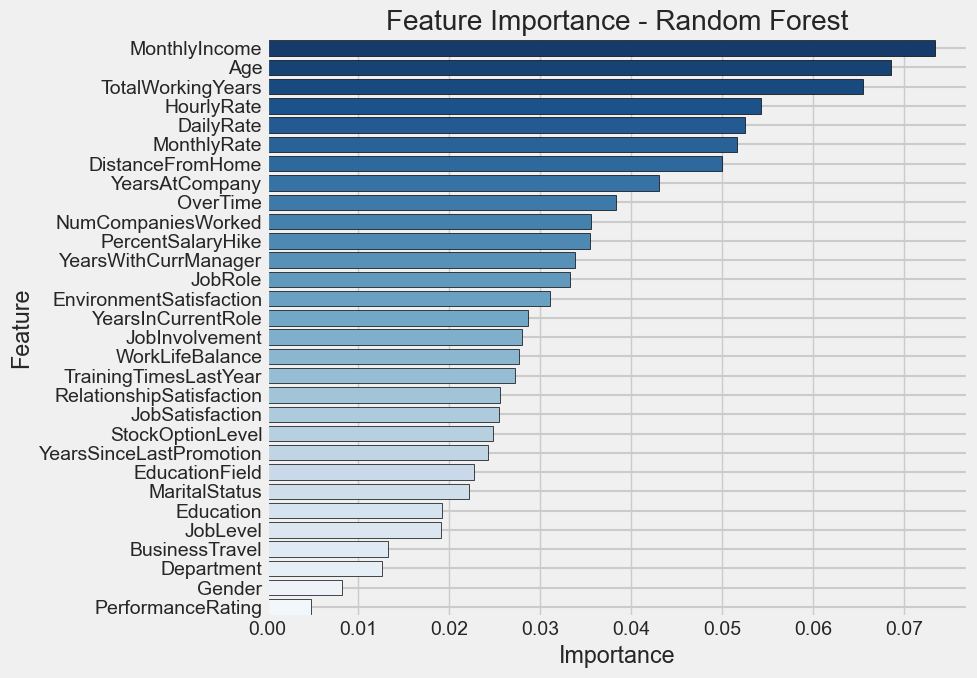

In [70]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier

# Create a Random Forest Classifier model
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)

# Fit the model on the training data
rf_model.fit(X_train, y_train)

# Get feature importances from the model
feature_importance = rf_model.feature_importances_

# Create a DataFrame to store feature names and their importances
df_importance = pd.DataFrame({'feature': X.columns, 'importance': feature_importance})

# Sort the DataFrame by importance in descending order
df_importance_sorted = df_importance.sort_values(by='importance', ascending=False )

plt.figure(figsize=(10, 7))  # Adjust the figure size

# Plot the feature importance with grid lines for spacing
ax = sns.barplot(data=df_importance_sorted, x='importance', y='feature', palette='Blues_r', edgecolor='black')

# Set x-axis label
ax.set_xlabel('Importance')

# Set y-axis label
ax.set_ylabel('Feature')

# Set title
plt.title('Feature Importance - Random Forest')

# Adjust the grid lines to provide spacing between features
ax.grid(linestyle='-', linewidth=1.5, axis='y')

plt.tight_layout()  # Adjust the spacing
plt.show()

## SUPPORT VECTOR MACHINE

Classification report:
               precision    recall  f1-score   support

           0      0.871     0.955     0.911       247
           1      0.522     0.255     0.343        47

    accuracy                          0.844       294
   macro avg      0.696     0.605     0.627       294
weighted avg      0.815     0.844     0.820       294

Confusion Matrix:
 [[236  11]
 [ 35  12]]


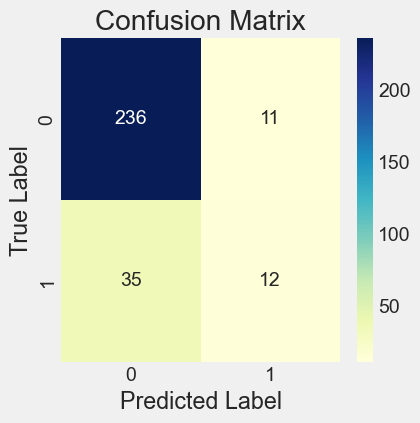

In [71]:
import numpy as np
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Set a fixed random seed
np.random.seed(42)

svm_model = SVC(kernel='linear')
svm_model.fit(X_train, y_train)

# Make predictions on the test data
y_pred_svm = svm_model.predict(X_test)

# Calculate classification report
report_svm = classification_report(y_test, y_pred_svm, digits=3)
print("Classification report:\n", report_svm)

# Generate confusion matrix
cmf_mtx_svm = confusion_matrix(y_test, y_pred_svm)

# Print confusion matrix
print("Confusion Matrix:\n", cmf_mtx_svm)

plt.figure(figsize=(4, 4))  # Set the figure size to your desired dimensions
sns.heatmap(cmf_mtx_svm, annot=True, cmap="YlGnBu", fmt='d')  # Use 'd' instead of 'g' to display integer values
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

### PLOT FEATURE IMPORTANCE

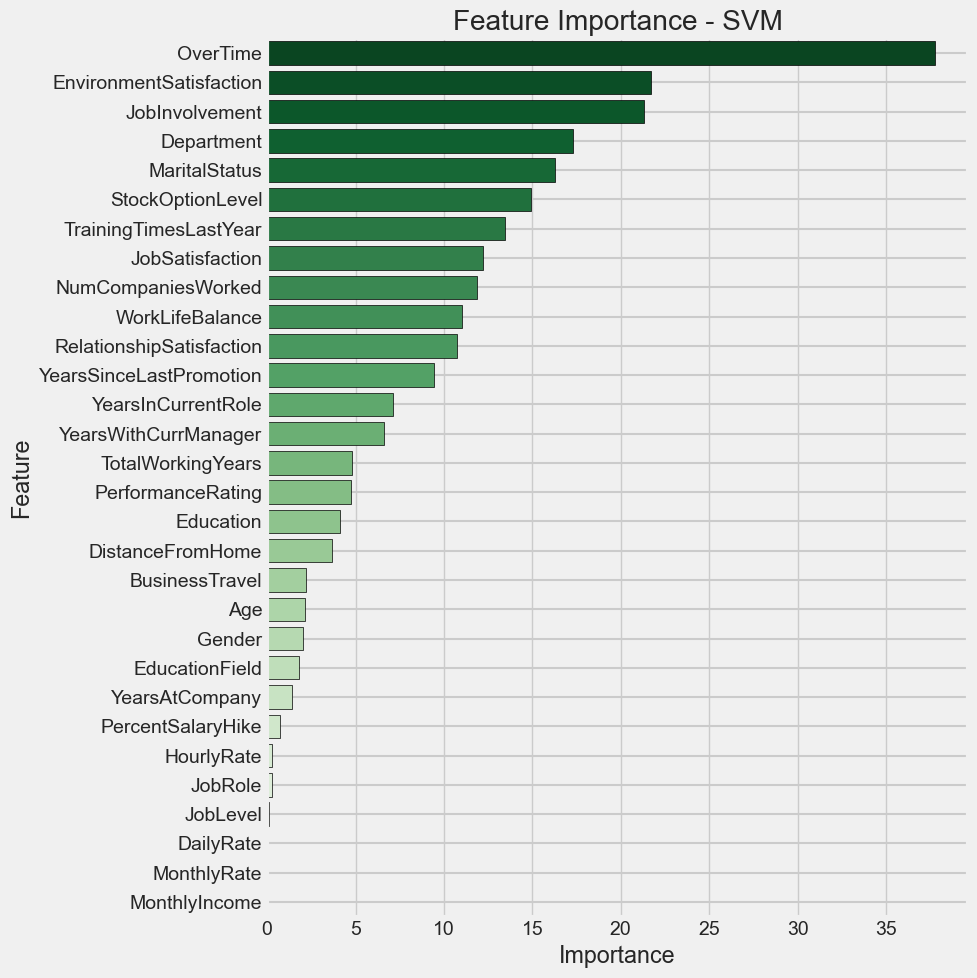

In [72]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.svm import SVC

# Create an SVM classifier model
svm_model = SVC(kernel='linear', C=1.0, random_state=42)

# Fit the model on the training data
svm_model.fit(X_train, y_train)

# Get feature importances from the model (coefficients)
feature_importance = np.abs(svm_model.coef_[0])

# Create a DataFrame to store feature names and their importances
df_importance = pd.DataFrame({'feature': X.columns, 'importance': feature_importance})

# Sort the DataFrame by importance in descending order
df_importance_sorted = df_importance.sort_values(by='importance', ascending=False)

plt.figure(figsize=(10, 10))  # Adjust the figure size

# Plot the feature importance with grid lines for spacing
ax = sns.barplot(data=df_importance_sorted, x='importance', y='feature', palette='Greens_r', edgecolor='black')

# Set x-axis label
ax.set_xlabel('Importance')

# Set y-axis label
ax.set_ylabel('Feature')

# Set title
plt.title('Feature Importance - SVM')

# Adjust the grid lines to provide spacing between features
ax.grid(linestyle='-', linewidth=1.5, axis='y')

plt.tight_layout()  # Adjust the spacing
plt.show()

## XTREME GRADIENT BOOST

In [73]:
!pip install xgboost

Classification report:
               precision    recall  f1-score   support

           0      0.876     0.976     0.923       247
           1      0.684     0.277     0.394        47

    accuracy                          0.864       294
   macro avg      0.780     0.626     0.659       294
weighted avg      0.846     0.864     0.839       294

Confusion Matrix:
 [[241   6]
 [ 34  13]]


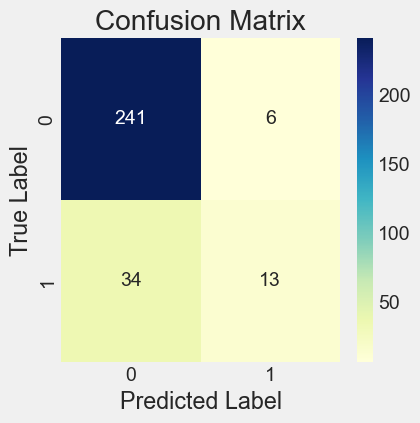

In [74]:
import numpy as np
from xgboost import XGBClassifier
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Set a fixed random seed
np.random.seed(42)

xgb_model = XGBClassifier()
xgb_model.fit(X_train, y_train)

# Make predictions on the test data
y_pred_xgb = xgb_model.predict(X_test)

# Calculate classification report
report_xgb = classification_report(y_test, y_pred_xgb, digits=3)
print("Classification report:\n", report_xgb)

# Generate confusion matrix
cmf_mtx_xgb = confusion_matrix(y_test, y_pred_xgb)

# Print confusion matrix
print("Confusion Matrix:\n", cmf_mtx_xgb)

plt.figure(figsize=(4, 4))  # Set the figure size to your desired dimensions
sns.heatmap(cmf_mtx_xgb, annot=True, cmap="YlGnBu", fmt='d')  # Use 'd' instead of 'g' to display integer values
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

### PLOT FEATURE IMPORTANCE

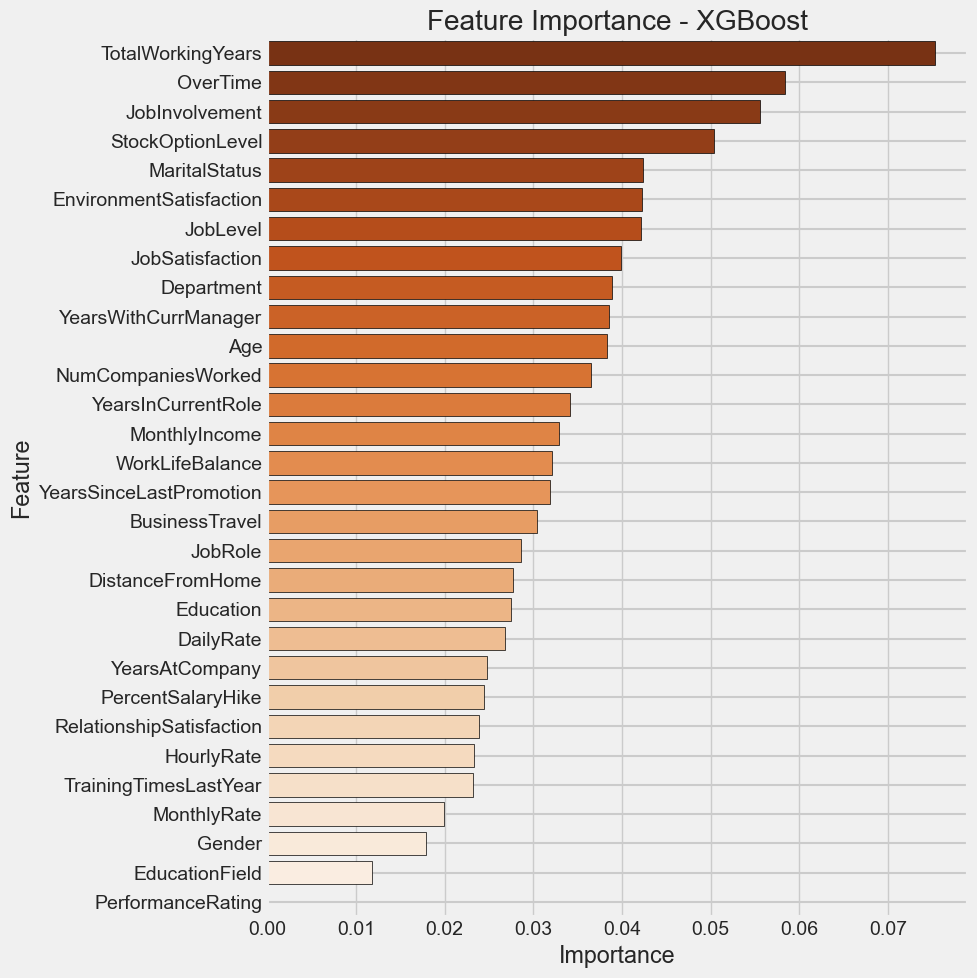

In [75]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import xgboost as xgb

# Create an XGBoost classifier model
xgb_model = xgb.XGBClassifier(random_state=42)

# Fit the model on the training data
xgb_model.fit(X_train, y_train)

# Get feature importances from the model
feature_importance = xgb_model.feature_importances_

# Create a DataFrame to store feature names and their importances
df_importance = pd.DataFrame({'feature': X.columns, 'importance': feature_importance})

# Sort the DataFrame by importance in descending order
df_importance_sorted = df_importance.sort_values(by='importance', ascending=False)

plt.figure(figsize=(10, 10))  # Adjust the figure size

# Plot the feature importance with grid lines for spacing
ax = sns.barplot(data=df_importance_sorted, x='importance', y='feature', palette='Oranges_r', edgecolor='black')

# Set x-axis label
ax.set_xlabel('Importance')

# Set y-axis label
ax.set_ylabel('Feature')

# Set title
plt.title('Feature Importance - XGBoost')

# Adjust the grid lines to provide spacing between features
ax.grid(linestyle='-', linewidth=1.5, axis='y')

plt.tight_layout()  # Adjust the spacing
plt.show()

## DECISION TREE

Classification report:
               precision    recall  f1-score   support

           0      0.870     0.870     0.870       247
           1      0.319     0.319     0.319        47

    accuracy                          0.782       294
   macro avg      0.595     0.595     0.595       294
weighted avg      0.782     0.782     0.782       294

Confusion Matrix:
 [[215  32]
 [ 32  15]]


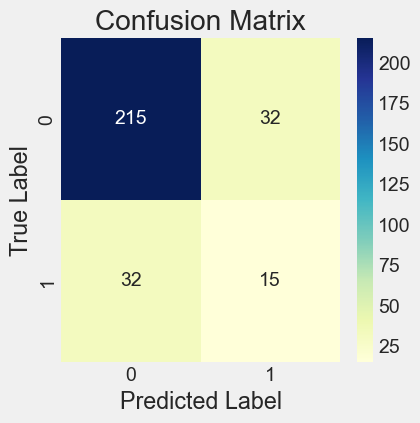

In [76]:
import numpy as np
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Set a fixed random seed
np.random.seed(42)

dt_model = DecisionTreeClassifier()
dt_model.fit(X_train, y_train)

# Make predictions on the test data
y_pred_dt = dt_model.predict(X_test)

# Calculate classification report
report_dt = classification_report(y_test, y_pred_dt, digits=3)
print("Classification report:\n", report_dt)

# Generate confusion matrix
cmf_mtx_dt = confusion_matrix(y_test, y_pred_dt)

# Print confusion matrix
print("Confusion Matrix:\n", cmf_mtx_dt)

plt.figure(figsize=(4, 4))  # Set the figure size to your desired dimensions
sns.heatmap(cmf_mtx_dt, annot=True, cmap="YlGnBu", fmt='d')  # Use 'd' instead of 'g' to display integer values
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

### PLOT FEATURES IMPORTANCE

<Figure size 1400x1000 with 0 Axes>

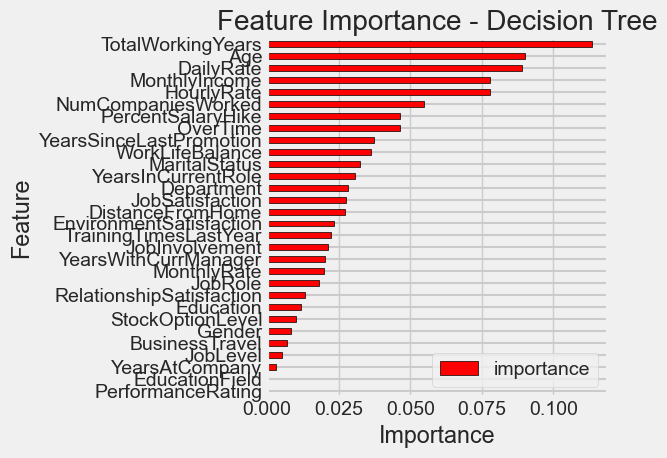

In [77]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier

# Create a Decision Tree Classifier model
dt_model = DecisionTreeClassifier(random_state=42)

# Fit the model on the training data
dt_model.fit(X_train, y_train)

# Get feature importances from the model
feature_importance = dt_model.feature_importances_

# Create a DataFrame to store feature names and their importances
df_importance = pd.DataFrame({'feature': X.columns, 'importance': feature_importance})

# Sort the DataFrame by importance in descending order
df_importance_sorted = df_importance.sort_values(by='importance', ascending=True)

plt.figure(figsize=(14, 10))  # Adjust the figure size

# Plot the feature importance with grid lines for spacing
ax = df_importance_sorted.plot(kind='barh', x='feature', y='importance', color='red', edgecolor='black')

# Set x-axis label
ax.set_xlabel('Importance')

# Set y-axis label
ax.set_ylabel('Feature')

# Set title
plt.title('Feature Importance - Decision Tree')

# Adjust the grid lines to provide spacing between features
ax.grid(linestyle='-', linewidth=1.5, axis='y')

plt.tight_layout()  # Adjust the spacing
plt.show()

### Comparison of Logistic Regression, Random Forest, Standard Vector Machine, Xtreme Gradient Boost and Decision Tree

In [78]:
pip install tabulate

Note: you may need to restart the kernel to use updated packages.


In [79]:
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from tabulate import tabulate

# Set a fixed random seed
np.random.seed(42)

# Define the models
models = {
    'LGR': LogisticRegression(solver='liblinear', penalty='l1'),
    'RF': RandomForestClassifier(n_estimators=100),
    'SVM': SVC(kernel='linear'),
    'XGB': XGBClassifier(),
    'DTree': DecisionTreeClassifier(),
}

# Create empty lists to store the results for both classes
results = []

# Evaluate each model and store the results in the lists
for model_name, model in models.items():
    model.fit(X_train, y_train)
    y_test_pred = model.predict(X_test)
    
    # Calculate performance metrics
    accuracy = accuracy_score(y_test, y_test_pred)
    precision_no = precision_score(y_test, y_test_pred, pos_label=0)
    precision_yes = precision_score(y_test, y_test_pred, pos_label=1)
    recall_no = recall_score(y_test, y_test_pred, pos_label=0)
    recall_yes = recall_score(y_test, y_test_pred, pos_label=1)
    f1_score_no = f1_score(y_test, y_test_pred, pos_label=0)
    f1_score_yes = f1_score(y_test, y_test_pred, pos_label=1)
    
     # Append the results to the list with three decimal points
    results.append([model_name, '{:.3f}'.format(accuracy), '{:.3f}'.format(precision_no), '{:.3f}'.format(precision_yes),
                    '{:.3f}'.format(recall_no), '{:.3f}'.format(recall_yes), '{:.3f}'.format(f1_score_no),
                    '{:.3f}'.format(f1_score_yes)])

# Print the results table
print("Model Comparison:")
print(tabulate(results, headers=['ML Model', 'Accuracy', 'Precision (No)', 'Precision (Yes)',
                                 'Recall (No)', 'Recall (Yes)', 'F1-Score (No)', 'F1-Score (Yes)'],
                                 colalign=("center", "center", "center", "center", "center", "center", "center", "center"),
                                 tablefmt='pretty'))

Model Comparison:
+----------+----------+----------------+-----------------+-------------+--------------+---------------+----------------+
| ML Model | Accuracy | Precision (No) | Precision (Yes) | Recall (No) | Recall (Yes) | F1-Score (No) | F1-Score (Yes) |
+----------+----------+----------------+-----------------+-------------+--------------+---------------+----------------+
|   LGR    |  0.874   |     0.889      |      0.708      |    0.972    |    0.362     |     0.928     |     0.479      |
|    RF    |  0.844   |     0.855      |      0.545      |    0.980    |    0.128     |     0.913     |     0.207      |
|   SVM    |  0.844   |     0.871      |      0.522      |    0.955    |    0.255     |     0.911     |     0.343      |
|   XGB    |  0.864   |     0.876      |      0.684      |    0.976    |    0.277     |     0.923     |     0.394      |
|  DTree   |  0.786   |     0.874      |      0.333      |    0.870    |    0.340     |     0.872     |     0.337      |
+----------+--

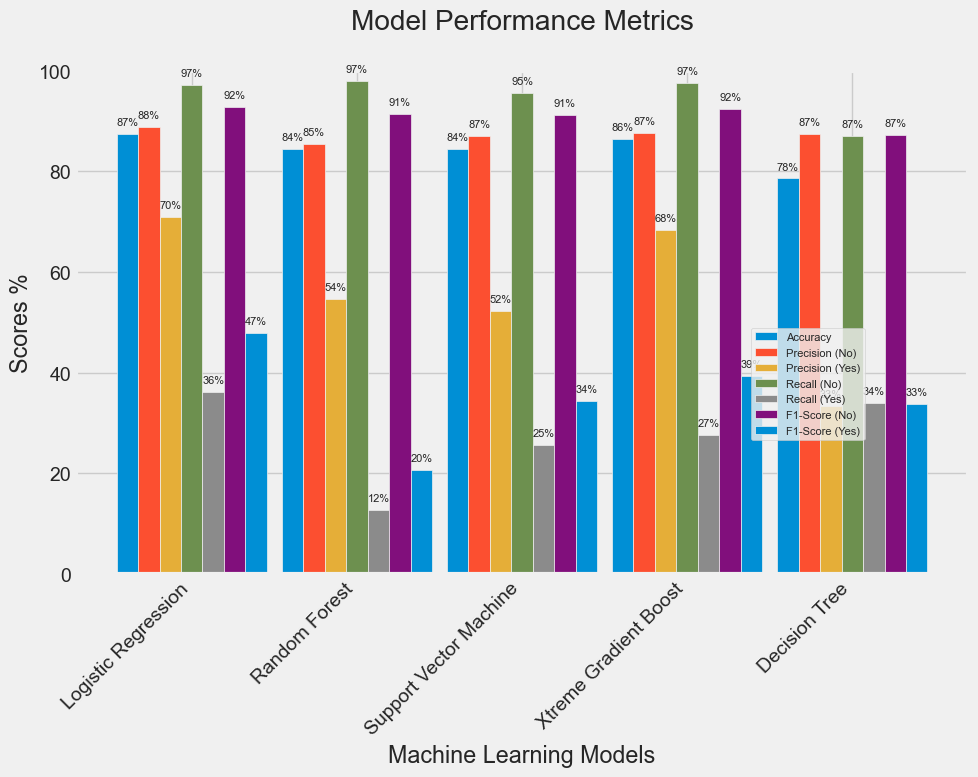

In [80]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score

# Set a fixed random seed
np.random.seed(42)

# Define the models
models = {
    'Logistic Regression': LogisticRegression(solver='liblinear', penalty='l1'),
    'Random Forest': RandomForestClassifier(n_estimators=100),
    'Support Vector Machine': SVC(kernel='linear'),
    'Xtreme Gradient Boost': XGBClassifier(),
    'Decision Tree': DecisionTreeClassifier(),
}

# Create empty lists to store the results for each metric
accuracy_scores = []
precision_no_scores = []
precision_yes_scores = []
recall_no_scores = []
recall_yes_scores = []
f1_score_no_scores = []
f1_score_yes_scores = []

# Evaluate each model and store the results in the lists
for model_name, model in models.items():
    model.fit(X_train, y_train)
    y_test_pred = model.predict(X_test)
    
    # Calculate performance metrics
    accuracy_scores.append(accuracy_score(y_test, y_test_pred) * 100)
    precision_no_scores.append(precision_score(y_test, y_test_pred, pos_label=0) * 100)
    precision_yes_scores.append(precision_score(y_test, y_test_pred, pos_label=1) * 100)
    recall_no_scores.append(recall_score(y_test, y_test_pred, pos_label=0) * 100)
    recall_yes_scores.append(recall_score(y_test, y_test_pred, pos_label=1) * 100)
    f1_score_no_scores.append(f1_score(y_test, y_test_pred, pos_label=0) * 100)
    f1_score_yes_scores.append(f1_score(y_test, y_test_pred, pos_label=1) * 100)

# Set the x-axis labels (model names)
model_names = list(models.keys())

# Create the bar plot
fig, ax = plt.subplots(figsize=(10, 8))

bar_width = 0.13
index = np.arange(len(model_names))

bars_accuracy = ax.bar(index, accuracy_scores, bar_width, label='Accuracy')
bars_precision_no = ax.bar(index + bar_width, precision_no_scores, bar_width, label='Precision (No)')
bars_precision_yes = ax.bar(index + 2 * bar_width, precision_yes_scores, bar_width, label='Precision (Yes)')
bars_recall_no = ax.bar(index + 3 * bar_width, recall_no_scores, bar_width, label='Recall (No)')
bars_recall_yes = ax.bar(index + 4 * bar_width, recall_yes_scores, bar_width, label='Recall (Yes)')
bars_f1_score_no = ax.bar(index + 5 * bar_width, f1_score_no_scores, bar_width, label='F1-Score (No)')
bars_f1_score_yes = ax.bar(index + 6 * bar_width, f1_score_yes_scores, bar_width, label='F1-Score (Yes)')

# Set y-axis limits to 0 and 100
ax.set_ylim(0, 100)

# Add the scores above each bar
def autolabel(bars):
    for bar in bars:
        height = bar.get_height()
        ax.annotate(f'{int(height)}%', xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 5), textcoords='offset points',
                    ha='center', va='bottom', fontsize=8)

autolabel(bars_accuracy)
autolabel(bars_precision_no)
autolabel(bars_precision_yes)
autolabel(bars_recall_no)
autolabel(bars_recall_yes)
autolabel(bars_f1_score_no)
autolabel(bars_f1_score_yes)

# Set the title and adjust the space between the title and the bars
plt.title('Model Performance Metrics', pad=30)

# Set the x-axis ticks and labels
ax.set_xticks(index + 3 * bar_width)
ax.set_xticklabels(model_names, rotation=45, ha='right')

# Set labels, title, and legend
plt.xlabel('Machine Learning Models')
plt.ylabel('Scores %')


# Customize the legend
ax.legend(bbox_to_anchor=(0.75, 0.5), loc='upper left', fontsize='8')

# Save and display the plot
plt.tight_layout()
plt.savefig('model_performance.png', dpi=300, bbox_inches='tight')
plt.show()

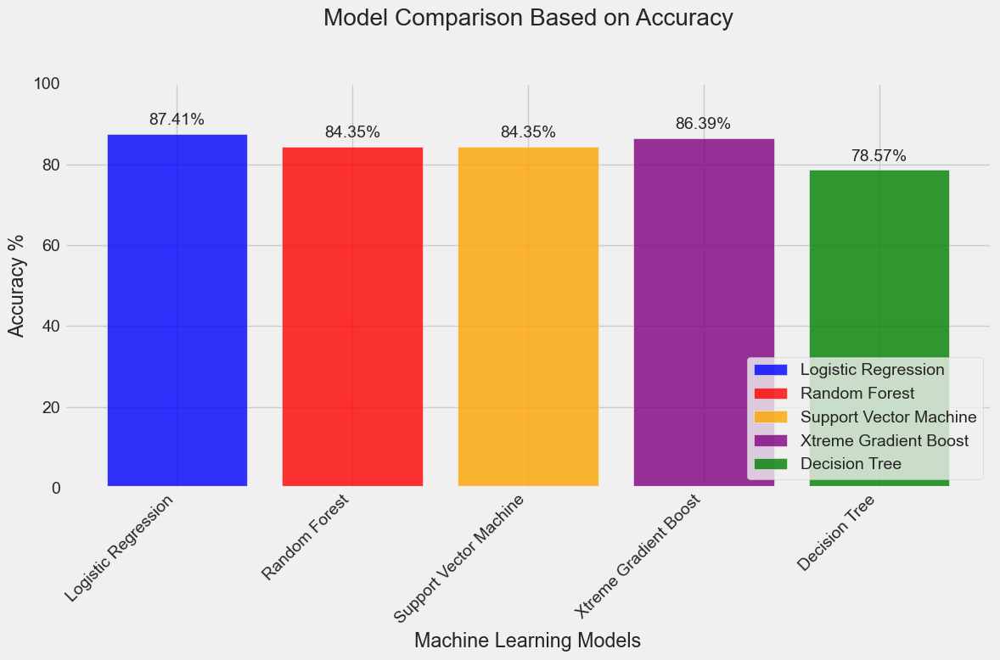

In [81]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score

# Set a fixed random seed
np.random.seed(42)

# Define the models
models = {
    'Logistic Regression': LogisticRegression(solver='liblinear', penalty='l1'),
    'Random Forest': RandomForestClassifier(n_estimators=100),
    'Support Vector Machine': SVC(kernel='linear'),
    'Xtreme Gradient Boost': XGBClassifier(),
    'Decision Tree': DecisionTreeClassifier(),
}

# Create empty lists to store the results
model_names = []
accuracy_scores = []

# Evaluate each model and store the results in the lists
for model_name, model in models.items():
    model.fit(X_train, y_train)
    y_test_pred = model.predict(X_test)
    
    # Calculate accuracy
    accuracy = accuracy_score(y_test, y_test_pred) * 100
    
    # Append the results to the lists with two significant figures
    model_names.append(model_name)
    accuracy_scores.append(round(accuracy, 2))

# Define a list of colors for each bar
colors = ['blue', 'red', 'orange', 'purple', 'green']

# Create the bar plot with alpha (transparency) set to 0.8
plt.figure(figsize=(12, 8))

# Loop to create bars for each model
for i in range(len(model_names)):
    plt.bar(model_names[i], accuracy_scores[i], color=colors[i], alpha=0.8, label=model_names[i])

# Set x-ticks and tick labels
plt.xticks(rotation=45, ha='right')

# Add the scores above each bar
for i, model_name in enumerate(model_names):
    height = accuracy_scores[i]
    plt.annotate(f'{height:.2f}%', xy=(i, height),
                 xytext=(0, 5), textcoords='offset points',
                 ha='center', va='bottom', fontsize=14)

# Set y-axis limits to 0 and 100
plt.ylim(0, 100)

# Set labels, title, and legend
plt.xlabel('Machine Learning Models')
plt.ylabel('Accuracy %')
plt.title('Model Comparison Based on Accuracy\n\n')

# Add legend to the plot in the upper right corner
plt.legend(loc='lower right')

# Show the plot
plt.tight_layout()
plt.show()

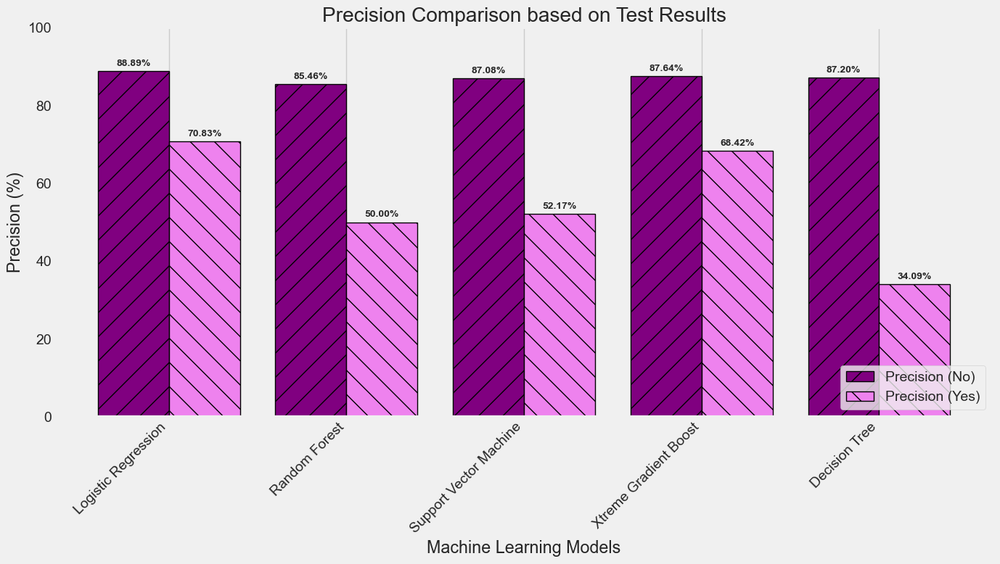

In [82]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report

# Define the models
models = {
    'Logistic Regression': LogisticRegression(solver='liblinear', penalty='l1'),
    'Random Forest': RandomForestClassifier(n_estimators=100),
    'Support Vector Machine': SVC(kernel='linear'),
    'Xtreme Gradient Boost': XGBClassifier(),
    'Decision Tree': DecisionTreeClassifier(),
}

# Create empty lists to store the precision values for 'No' and 'Yes'
precision_no_list = []
precision_yes_list = []

# Evaluate each model and store the precision values in the lists
for model_name, model in models.items():
    model.fit(X_train, y_train)
    y_test_pred = model.predict(X_test)
    report = classification_report(y_test, y_test_pred, output_dict=True)
    precision_no_list.append(report['0']['precision'] * 100)
    precision_yes_list.append(report['1']['precision'] * 100)

# Colors for 'No' and 'Yes' bars
color_no = 'purple'
color_yes = 'violet'

# Plot the bar chart
plt.figure(figsize=(14, 8))  # Adjust the figure size
bar_width = 0.4

# Set positions for the bars
positions = range(len(models))

# Plot the bars for Precision 'No' and 'Yes' with custom colors
bars1 = plt.bar(positions, precision_no_list, bar_width, label='Precision (No)', align='center', alpha=1.0, color=color_no, edgecolor='black', linewidth=1, hatch='/', zorder=2)
bars2 = plt.bar([pos + bar_width for pos in positions], precision_yes_list, bar_width, label='Precision (Yes)', align='center', alpha=1.0, color=color_yes, edgecolor='black', linewidth=1, hatch='\\', zorder=2)

# Set the x-axis labels to be the model names
plt.xticks([pos + bar_width/2 for pos in positions], models.keys(), rotation=45, ha='right')

plt.xlabel('Machine Learning Models')
plt.ylabel('Precision (%)')
plt.title('Precision Comparison based on Test Results')
plt.legend(loc='lower right')
plt.grid(axis='y')

def autolabel(bars):
    for bar in bars:
        height = bar.get_height()
        plt.annotate(f'{height:.2f}%', xy=(bar.get_x() + bar.get_width() / 2, height),
                     xytext=(0, 3), textcoords='offset points',
                     ha='center', va='bottom', fontsize=10, fontweight='bold')
autolabel(bars1)
autolabel(bars2)

plt.ylim(0, 100)

plt.tight_layout()
plt.show()

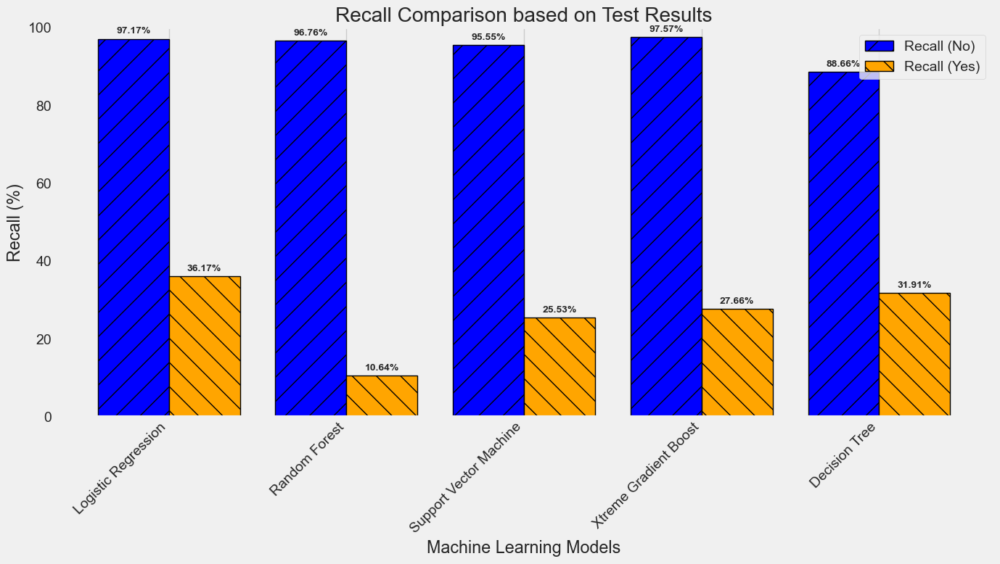

In [83]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report

# Define the models
models = {
    'Logistic Regression': LogisticRegression(solver='liblinear', penalty='l1'),
    'Random Forest': RandomForestClassifier(n_estimators=100),
    'Support Vector Machine': SVC(kernel='linear'),
    'Xtreme Gradient Boost': XGBClassifier(),
    'Decision Tree': DecisionTreeClassifier(),
}

# Create empty lists to store the recall values for 'No' and 'Yes'
recall_no_list = []
recall_yes_list = []

# Evaluate each model and store the recall values in the lists
for model_name, model in models.items():
    model.fit(X_train, y_train)
    y_test_pred = model.predict(X_test)
    report = classification_report(y_test, y_test_pred, output_dict=True)
    recall_no_list.append(report['0']['recall'] * 100)
    recall_yes_list.append(report['1']['recall'] * 100)

# Colors for 'No' and 'Yes' bars
color_no = 'blue'
color_yes = 'orange'

# Plot the bar chart for Recall
plt.figure(figsize=(14, 8))  # Adjust the figure size
bar_width = 0.4

# Set positions for the bars
positions = range(len(models))

# Plot the bars for Recall 'No' and 'Yes' with custom colors
bars1 = plt.bar(positions, recall_no_list, bar_width, label='Recall (No)', align='center', alpha=1.0, color=color_no, edgecolor='black', linewidth=1, hatch='/', zorder=2)
bars2 = plt.bar([pos + bar_width for pos in positions], recall_yes_list, bar_width, label='Recall (Yes)', align='center', alpha=1.0, color=color_yes, edgecolor='black', linewidth=1, hatch='\\', zorder=2)

# Set the x-axis labels to be the model names
plt.xticks([pos + bar_width/2 for pos in positions], models.keys(), rotation=45, ha='right')

plt.xlabel('Machine Learning Models')
plt.ylabel('Recall (%)')
plt.title('Recall Comparison based on Test Results')
plt.legend(loc='upper right')
plt.grid(axis='y')

def autolabel(bars):
    for bar in bars:
        height = bar.get_height()
        plt.annotate(f'{height:.2f}%', xy=(bar.get_x() + bar.get_width() / 2, height),
                     xytext=(0, 3), textcoords='offset points',
                     ha='center', va='bottom', fontsize=10, fontweight='bold')

autolabel(bars1)
autolabel(bars2)

plt.ylim(0, 100)

plt.tight_layout()
plt.show()

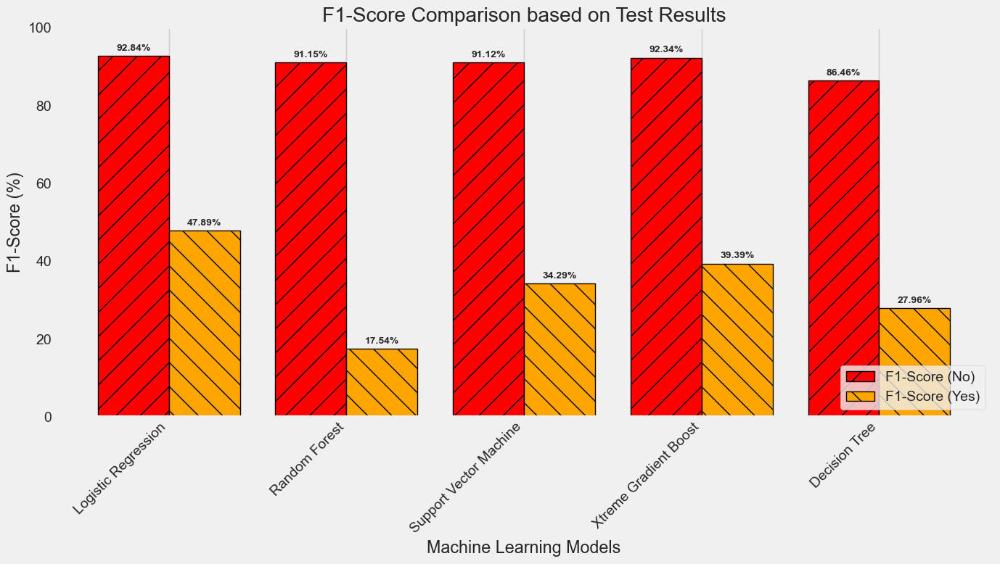

In [84]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report

# Define the models
models = {
    'Logistic Regression': LogisticRegression(solver='liblinear', penalty='l1'),
    'Random Forest': RandomForestClassifier(n_estimators=100),
    'Support Vector Machine': SVC(kernel='linear'),
    'Xtreme Gradient Boost': XGBClassifier(),
    'Decision Tree': DecisionTreeClassifier(),
}

# Create empty lists to store the F1-Score values for 'No' and 'Yes'
f1_no_list = []
f1_yes_list = []

# Evaluate each model and store the F1-Score values in the lists
for model_name, model in models.items():
    model.fit(X_train, y_train)
    y_test_pred = model.predict(X_test)
    report = classification_report(y_test, y_test_pred, output_dict=True)
    f1_no_list.append(report['0']['f1-score'] * 100)
    f1_yes_list.append(report['1']['f1-score'] * 100)

# Colors for 'No' and 'Yes' bars
color_no = 'red'
color_yes = 'orange'

# Plot the bar chart for F1-Score
plt.figure(figsize=(14, 8))  # Adjust the figure size

# Set positions for the bars
positions = range(len(models))

# Plot the bars for F1-Score 'No' and 'Yes' with custom colors
bars1 = plt.bar(positions, f1_no_list, bar_width, label='F1-Score (No)', align='center', alpha=1.0, color=color_no, edgecolor='black', linewidth=1, hatch='/', zorder=2)
bars2 = plt.bar([pos + bar_width for pos in positions], f1_yes_list, bar_width, label='F1-Score (Yes)', align='center', alpha=1.0, color=color_yes, edgecolor='black', linewidth=1, hatch='\\', zorder=2)

# Set the x-axis labels to be the model names
plt.xticks([pos + bar_width/2 for pos in positions], models.keys(), rotation=45, ha='right')

plt.xlabel('Machine Learning Models')
plt.ylabel('F1-Score (%)')
plt.title('F1-Score Comparison based on Test Results')
plt.legend(loc='lower right')
plt.grid(axis='y')



autolabel(bars1)
autolabel(bars2)

plt.ylim(0, 100)

plt.tight_layout()
plt.show()

## IMPROVE PERFORMANCE OF THE MODEL

### FEATURE ENGINEERING

In [85]:
    # Feature scaling - Standardization
    from sklearn.preprocessing import StandardScaler

    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

## LOGISTIC REGRESSION

Best Hyperparameters: {'C': 0.1, 'penalty': 'l2'}
Classification report:
               precision    recall  f1-score   support

           0      0.889     0.976     0.931       247
           1      0.739     0.362     0.486        47

    accuracy                          0.878       294
   macro avg      0.814     0.669     0.708       294
weighted avg      0.865     0.878     0.859       294

Confusion Matrix:
 [[241   6]
 [ 30  17]]


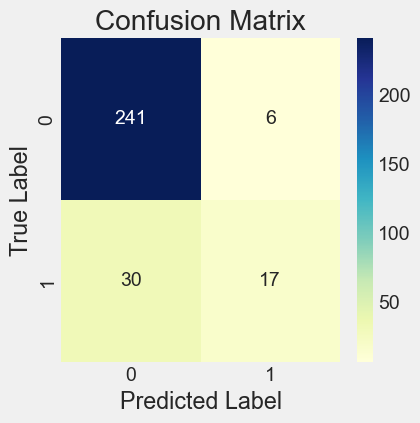

In [86]:
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import GridSearchCV

# Set a fixed random seed
np.random.seed(42)

# Define the parameter grid for hyperparameter tuning
param_grid = {
    'penalty': ['l1', 'l2'],
    'C': [0.01, 0.1, 1, 10, 100]
}

# Create a Logistic Regression model
lgr_model = LogisticRegression(solver='liblinear', max_iter=1000)

# Create GridSearchCV to find the best hyperparameters
grid_search = GridSearchCV(lgr_model, param_grid, cv=5, scoring='accuracy', n_jobs=-1)

# Fit the model on the training data with hyperparameter tuning
grid_search.fit(X_train_scaled, y_train)

# Get the best hyperparameters from the GridSearchCV
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

# Make predictions on the test data using the best model from GridSearchCV
best_lgr_model = grid_search.best_estimator_
y_pred_lgr = best_lgr_model.predict(X_test_scaled)

# Calculate classification report
report_lgr = classification_report(y_test, y_pred_lgr, digits=3)
print("Classification report:\n", report_lgr)

# Generate confusion matrix
cmf_mtx = confusion_matrix(y_test, y_pred_lgr)

# Print confusion matrix
print("Confusion Matrix:\n", cmf_mtx)

plt.figure(figsize=(4, 4))  # Set the figure size to your desired dimensions
sns.heatmap(cmf_mtx, annot=True, cmap="YlGnBu", fmt='d')  # Use 'd' instead of 'g' to display integer values
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

### FEATURE IMPORTANCE

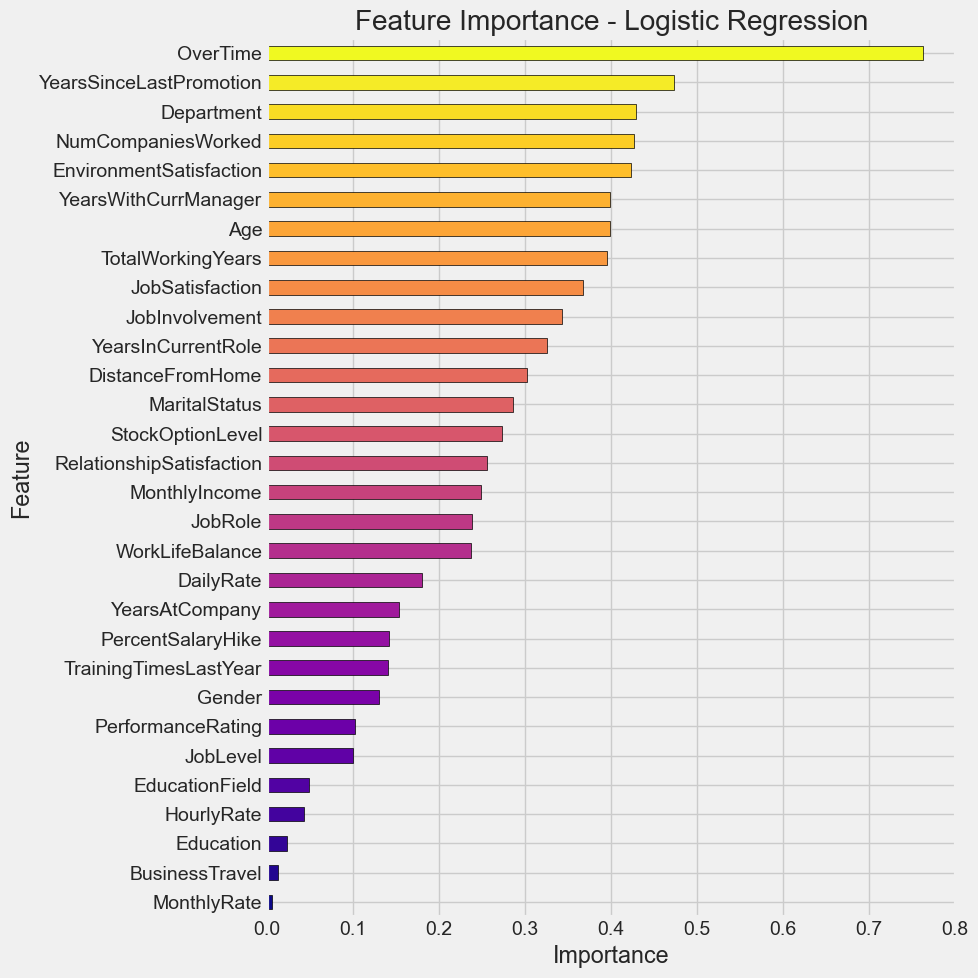

In [87]:
import pandas as pd
import numpy as np

# Create the Logistic Regression model
lgr_model = LogisticRegression(solver='liblinear', penalty='l1')

# Fit the model on the training data
lgr_model.fit(X_train_scaled, y_train)

# Get feature coefficients
df = pd.DataFrame()
df['feature'] = X.columns
df['coefficient'] = np.abs(lgr_model.coef_[0])  # Get absolute values of coefficients for importance

# Sort the DataFrame by importance in descending order
df_sorted = df.sort_values(by='coefficient', ascending=True)

# Reset the index to use the default numeric index
df_sorted.reset_index(drop=True, inplace=True)

# Use 'plasma' colormap for bar colors
bar_colors = plt.cm.plasma(np.linspace(0, 1, len(df_sorted)))

plt.figure(figsize=(10, 10))  # Adjust the figure size

# Plot the feature importance
ax = df_sorted['coefficient'].plot(kind='barh', color=bar_colors, edgecolor='black')

# Set y-tick labels to the feature names
ax.set_yticks(range(len(df_sorted)))
ax.set_yticklabels(df_sorted['feature'])

plt.title('Feature Importance - Logistic Regression')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.tight_layout()  # Adjust the spacing
plt.show()

## RANDOM FOREST

Best Hyperparameters: {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}
Classification report:
               precision    recall  f1-score   support

           0      0.854     0.972     0.909       247
           1      0.462     0.128     0.200        47

    accuracy                          0.837       294
   macro avg      0.658     0.550     0.555       294
weighted avg      0.791     0.837     0.796       294

Confusion Matrix:
 [[240   7]
 [ 41   6]]


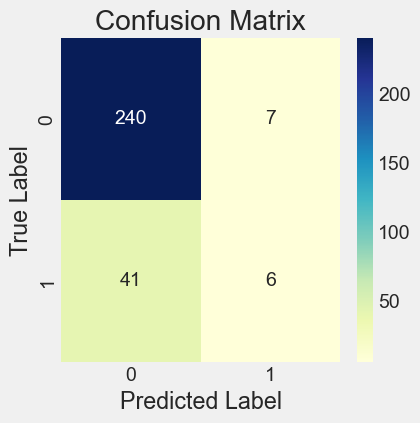

In [88]:
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import GridSearchCV

# Set a fixed random seed
np.random.seed(42)

# Define the parameter grid for hyperparameter tuning
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Create a Random Forest Classifier model
rf_model = RandomForestClassifier(random_state=42)

# Create GridSearchCV to find the best hyperparameters
grid_search = GridSearchCV(rf_model, param_grid, cv=5, scoring='accuracy', n_jobs=-1)

# Fit the model on the training data with hyperparameter tuning
grid_search.fit(X_train_scaled, y_train)

# Get the best hyperparameters from the GridSearchCV
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

# Make predictions on the test data using the best model from GridSearchCV
best_rf_model = grid_search.best_estimator_
y_pred_rf = best_rf_model.predict(X_test_scaled)

# Calculate classification report
report_rf = classification_report(y_test, y_pred_rf, digits=3)
print("Classification report:\n", report_rf)

# Generate confusion matrix
cm_rf = confusion_matrix(y_test, y_pred_rf)

# Print confusion matrix
print("Confusion Matrix:\n", cm_rf)

plt.figure(figsize=(4, 4))  # Set the figure size to your desired dimensions
sns.heatmap(cm_rf, annot=True, cmap="YlGnBu", fmt='d')  # Use 'd' instead of 'g' to display integer values
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

### FEATURE IMPORTANCE

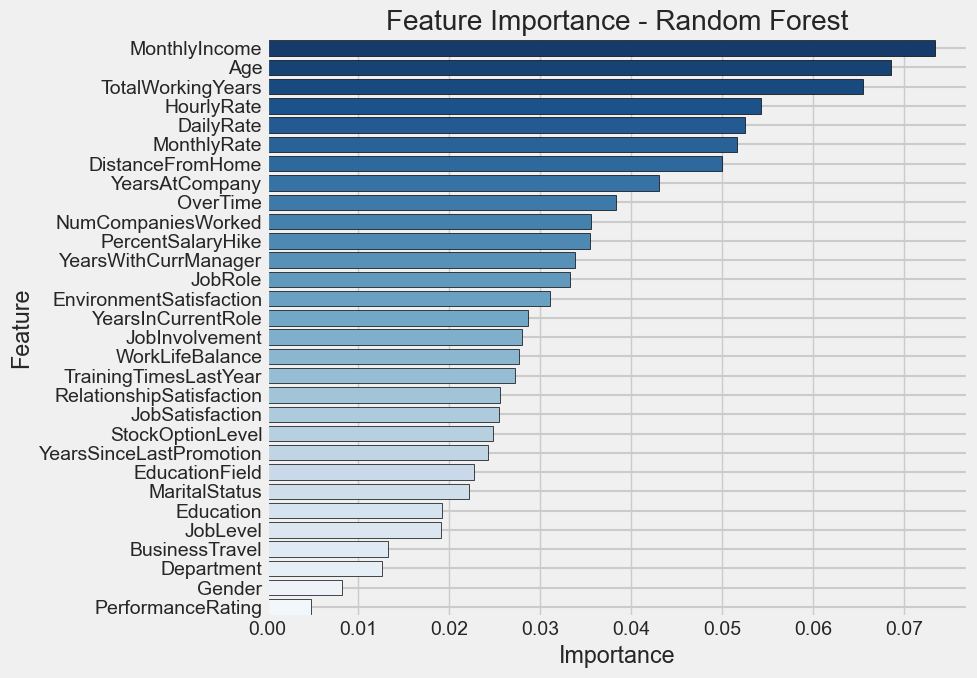

In [89]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier

# Create a Random Forest Classifier model
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)

# Fit the model on the training data
rf_model.fit(X_train, y_train)

# Get feature importances from the model
feature_importance = rf_model.feature_importances_

# Create a DataFrame to store feature names and their importances
df_importance = pd.DataFrame({'feature': X.columns, 'importance': feature_importance})

# Sort the DataFrame by importance in descending order
df_importance_sorted = df_importance.sort_values(by='importance', ascending=False )

plt.figure(figsize=(10, 7))  # Adjust the figure size

# Plot the feature importance with grid lines for spacing
ax = sns.barplot(data=df_importance_sorted, x='importance', y='feature', palette='Blues_r', edgecolor='black')

# Set x-axis label
ax.set_xlabel('Importance')

# Set y-axis label
ax.set_ylabel('Feature')

# Set title
plt.title('Feature Importance - Random Forest')

# Adjust the grid lines to provide spacing between features
ax.grid(linestyle='-', linewidth=1.5, axis='y')

plt.tight_layout()  # Adjust the spacing
plt.show()

## SUPPORT VECTOR MACHINE

Best Hyperparameters: {'C': 1, 'gamma': 'scale', 'kernel': 'linear'}
Classification report:
               precision    recall  f1-score   support

           0      0.885     0.996     0.937       247
           1      0.938     0.319     0.476        47

    accuracy                          0.888       294
   macro avg      0.911     0.658     0.707       294
weighted avg      0.893     0.888     0.863       294

Confusion Matrix:
 [[246   1]
 [ 32  15]]


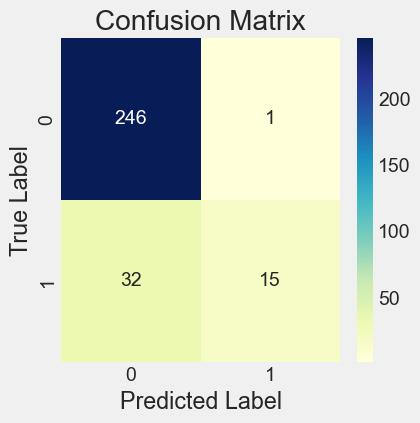

In [90]:
import numpy as np
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import GridSearchCV

# Set a fixed random seed
np.random.seed(42)

# Define the parameter grid for hyperparameter tuning
param_grid = {
    'C': [0.1, 1, 10],
    'kernel': ['linear', 'rbf'],
    'gamma': ['scale', 'auto']
}

# Create an SVM classifier model
svm_model = SVC(random_state=42)

# Create GridSearchCV to find the best hyperparameters
grid_search = GridSearchCV(svm_model, param_grid, cv=5, scoring='accuracy', n_jobs=-1)

# Fit the model on the training data with hyperparameter tuning
grid_search.fit(X_train_scaled, y_train)

# Get the best hyperparameters from the GridSearchCV
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

# Make predictions on the test data using the best model from GridSearchCV
best_svm_model = grid_search.best_estimator_
y_pred_svm = best_svm_model.predict(X_test_scaled)

# Calculate classification report
report_svm = classification_report(y_test, y_pred_svm, digits=3)
print("Classification report:\n", report_svm)

# Generate confusion matrix
cm_svm = confusion_matrix(y_test, y_pred_svm)

# Print confusion matrix
print("Confusion Matrix:\n", cm_svm)

plt.figure(figsize=(4, 4))  # Set the figure size to your desired dimensions
sns.heatmap(cm_svm, annot=True, cmap="YlGnBu", fmt='d')  # Use 'd' instead of 'g' to display integer values
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

### FEATURE IMPORTANCE

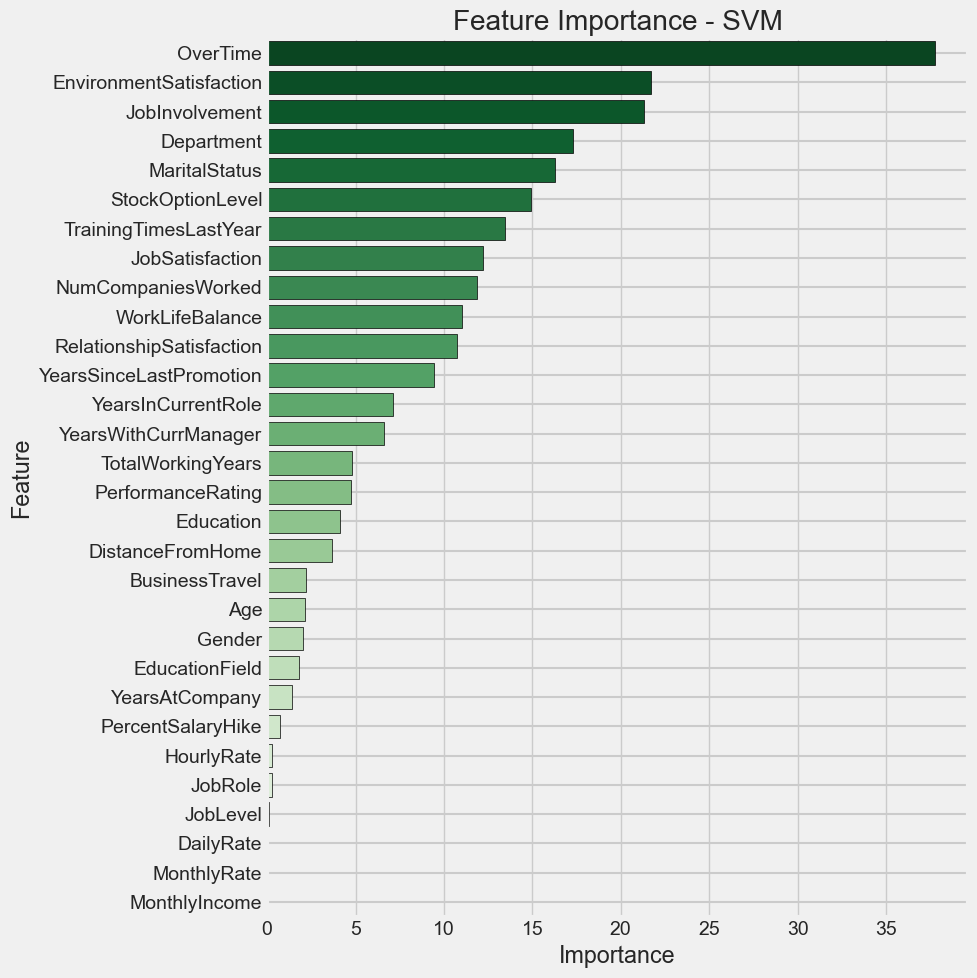

In [91]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.svm import SVC

# Create an SVM classifier model
svm_model = SVC(kernel='linear', C=1.0, random_state=42)

# Fit the model on the training data
svm_model.fit(X_train, y_train)

# Get feature importances from the model (coefficients)
feature_importance = np.abs(svm_model.coef_[0])

# Create a DataFrame to store feature names and their importances
df_importance = pd.DataFrame({'feature': X.columns, 'importance': feature_importance})

# Sort the DataFrame by importance in descending order
df_importance_sorted = df_importance.sort_values(by='importance', ascending=False)

plt.figure(figsize=(10, 10))  # Adjust the figure size

# Plot the feature importance with grid lines for spacing
ax = sns.barplot(data=df_importance_sorted, x='importance', y='feature', palette='Greens_r', edgecolor='black')

# Set x-axis label
ax.set_xlabel('Importance')

# Set y-axis label
ax.set_ylabel('Feature')

# Set title
plt.title('Feature Importance - SVM')

# Adjust the grid lines to provide spacing between features
ax.grid(linestyle='-', linewidth=1.5, axis='y')

plt.tight_layout()  # Adjust the spacing
plt.show()

## XTREME GRADIENT BOOST

Best Hyperparameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 100}
Classification report:
               precision    recall  f1-score   support

           0      0.875     0.988     0.928       247
           1      0.800     0.255     0.387        47

    accuracy                          0.871       294
   macro avg      0.837     0.622     0.657       294
weighted avg      0.863     0.871     0.841       294

Confusion Matrix:
 [[244   3]
 [ 35  12]]


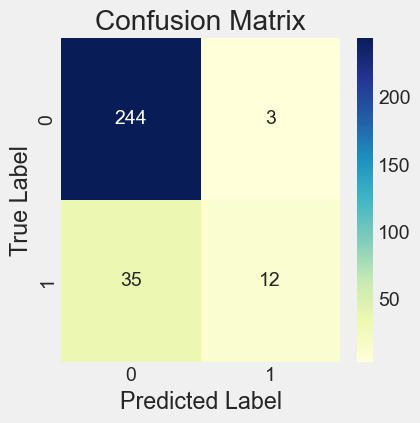

In [92]:
import numpy as np
from xgboost import XGBClassifier
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import GridSearchCV

# Set a fixed random seed
np.random.seed(42)

# Define the parameter grid for hyperparameter tuning
param_grid = {
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'n_estimators': [100, 200, 300]
}

# Create an XGBoost classifier model
xgb_model = XGBClassifier(random_state=42)

# Create GridSearchCV to find the best hyperparameters
grid_search = GridSearchCV(xgb_model, param_grid, cv=5, scoring='accuracy', n_jobs=-1)

# Fit the model on the training data with hyperparameter tuning
grid_search.fit(X_train_scaled, y_train)

# Get the best hyperparameters from the GridSearchCV
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

# Make predictions on the test data using the best model from GridSearchCV
best_xgb_model = grid_search.best_estimator_
y_pred_xgb = best_xgb_model.predict(X_test_scaled)

# Calculate classification report
report_xgb = classification_report(y_test, y_pred_xgb, digits=3)
print("Classification report:\n", report_xgb)

# Generate confusion matrix
cm_xgb = confusion_matrix(y_test, y_pred_xgb)

# Print confusion matrix
print("Confusion Matrix:\n", cm_xgb)

plt.figure(figsize=(4, 4))  # Set the figure size to your desired dimensions
sns.heatmap(cm_xgb, annot=True, cmap="YlGnBu", fmt='d')  # Use 'd' instead of 'g' to display integer values
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

### FEATURE IMPORTANCE

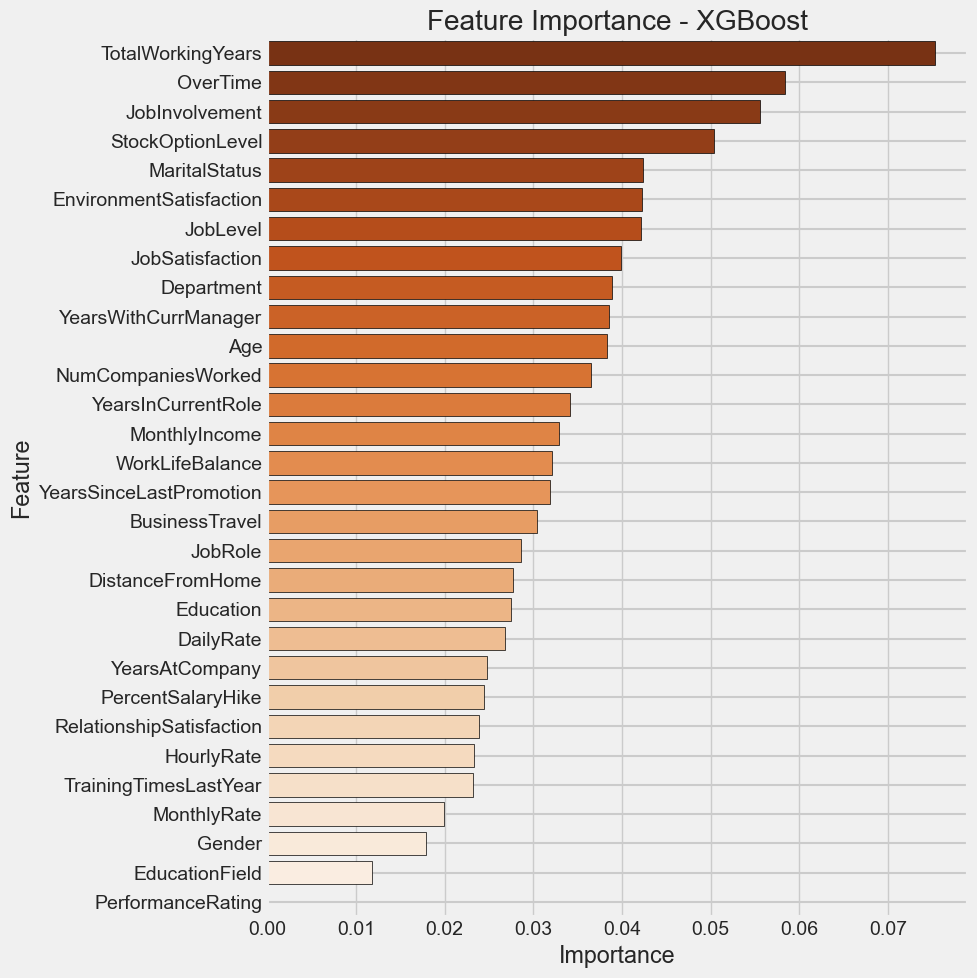

In [93]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import xgboost as xgb

# Create an XGBoost classifier model
xgb_model = xgb.XGBClassifier(random_state=42)

# Fit the model on the training data
xgb_model.fit(X_train, y_train)

# Get feature importances from the model
feature_importance = xgb_model.feature_importances_

# Create a DataFrame to store feature names and their importances
df_importance = pd.DataFrame({'feature': X.columns, 'importance': feature_importance})

# Sort the DataFrame by importance in descending order
df_importance_sorted = df_importance.sort_values(by='importance', ascending=False)

plt.figure(figsize=(10, 10))  # Adjust the figure size

# Plot the feature importance with grid lines for spacing
ax = sns.barplot(data=df_importance_sorted, x='importance', y='feature', palette='Oranges_r', edgecolor='black')

# Set x-axis label
ax.set_xlabel('Importance')

# Set y-axis label
ax.set_ylabel('Feature')

# Set title
plt.title('Feature Importance - XGBoost')

# Adjust the grid lines to provide spacing between features
ax.grid(linestyle='-', linewidth=1.5, axis='y')

plt.tight_layout()  # Adjust the spacing
plt.show()

## DECISION TREE

Best Hyperparameters: {'criterion': 'gini', 'max_depth': 3, 'min_samples_leaf': 1, 'min_samples_split': 2}
Classification report:
               precision    recall  f1-score   support

           0      0.868     0.931     0.898       247
           1      0.414     0.255     0.316        47

    accuracy                          0.823       294
   macro avg      0.641     0.593     0.607       294
weighted avg      0.795     0.823     0.805       294

Confusion Matrix:
 [[230  17]
 [ 35  12]]


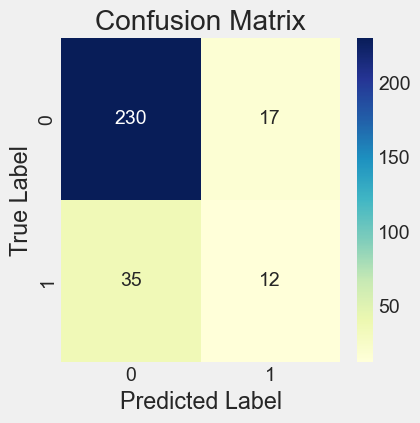

In [94]:
import numpy as np
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import GridSearchCV

# Set a fixed random seed
np.random.seed(42)

# Define the parameter grid for hyperparameter tuning
param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [3, 5, 7, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Create a Decision Tree classifier model
dt_model = DecisionTreeClassifier(random_state=42)

# Create GridSearchCV to find the best hyperparameters
grid_search = GridSearchCV(dt_model, param_grid, cv=5, scoring='accuracy', n_jobs=-1)

# Fit the model on the training data with hyperparameter tuning
grid_search.fit(X_train_scaled, y_train)

# Get the best hyperparameters from the GridSearchCV
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

# Make predictions on the test data using the best model from GridSearchCV
best_dt_model = grid_search.best_estimator_
y_pred_dt = best_dt_model.predict(X_test_scaled)

# Calculate classification report
report_dt = classification_report(y_test, y_pred_dt, digits=3)
print("Classification report:\n", report_dt)

# Generate confusion matrix
cm_dt = confusion_matrix(y_test, y_pred_dt)

# Print confusion matrix
print("Confusion Matrix:\n", cm_dt)

plt.figure(figsize=(4, 4))  # Set the figure size to your desired dimensions
sns.heatmap(cm_dt, annot=True, cmap="YlGnBu", fmt='d')  # Use 'd' instead of 'g' to display integer values
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()


### FEATURE IMPORTANCE

<Figure size 1400x1000 with 0 Axes>

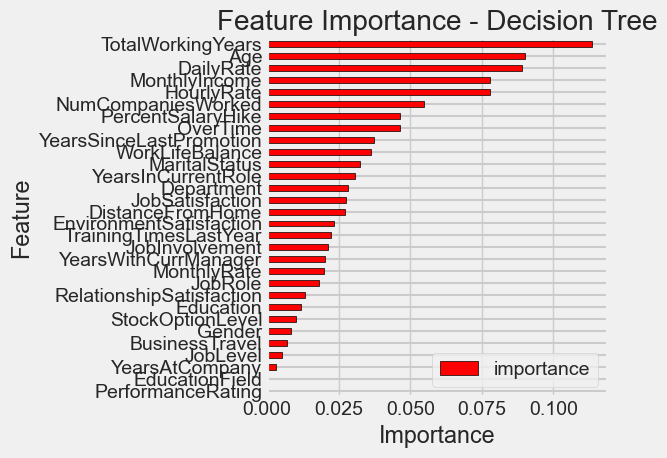

In [95]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier

# Create a Decision Tree Classifier model
dt_model = DecisionTreeClassifier(random_state=42)

# Fit the model on the training data
dt_model.fit(X_train, y_train)

# Get feature importances from the model
feature_importance = dt_model.feature_importances_

# Create a DataFrame to store feature names and their importances
df_importance = pd.DataFrame({'feature': X.columns, 'importance': feature_importance})

# Sort the DataFrame by importance in descending order
df_importance_sorted = df_importance.sort_values(by='importance', ascending=True)

plt.figure(figsize=(14, 10))  # Adjust the figure size

# Plot the feature importance with grid lines for spacing
ax = df_importance_sorted.plot(kind='barh', x='feature', y='importance', color='red', edgecolor='black')

# Set x-axis label
ax.set_xlabel('Importance')

# Set y-axis label
ax.set_ylabel('Feature')

# Set title
plt.title('Feature Importance - Decision Tree')

# Adjust the grid lines to provide spacing between features
ax.grid(linestyle='-', linewidth=1.5, axis='y')

plt.tight_layout()  # Adjust the spacing
plt.show()

In [96]:
pip install tabulate

In [97]:
import pandas as pd
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Initialize empty dictionaries to store the performance metrics for each model
model_metrics = {
    'Model': [],
    'Accuracy': [],
    'Precision (No)': [],
    'Precision (Yes)': [],
    'Recall (No)': [],
    'Recall (Yes)': [],
    'F1-score (No)': [],
    'F1-score (Yes)': []
}

# Function to compute and store metrics for each model
def compute_metrics(model, model_name, X_test, y_test):
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    precision_no = precision_score(y_test, y_pred, pos_label=0)
    precision_yes = precision_score(y_test, y_pred, pos_label=1)
    recall_no = recall_score(y_test, y_pred, pos_label=0)
    recall_yes = recall_score(y_test, y_pred, pos_label=1)
    f1_no = f1_score(y_test, y_pred, pos_label=0)
    f1_yes = f1_score(y_test, y_pred, pos_label=1)
    
    model_metrics['Model'].append(model_name)
    model_metrics['Accuracy'].append(round(accuracy, 3))
    model_metrics['Precision (No)'].append(round(precision_no, 3))
    model_metrics['Precision (Yes)'].append(round(precision_yes, 3))
    model_metrics['Recall (No)'].append(round(recall_no, 3))
    model_metrics['Recall (Yes)'].append(round(recall_yes, 3))
    model_metrics['F1-score (No)'].append(round(f1_no, 3))
    model_metrics['F1-score (Yes)'].append(round(f1_yes, 3))

# Logistic Regression
lgr_model = LogisticRegression(solver='liblinear', penalty='l1')
lgr_model.fit(X_train_scaled, y_train)
compute_metrics(lgr_model, 'LGR', X_test_scaled, y_test)

# Random Forest
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train_scaled, y_train)
compute_metrics(rf_model, 'RF', X_test_scaled, y_test)

# SVM
svm_model = SVC(kernel='linear', C=1)
svm_model.fit(X_train_scaled, y_train)
compute_metrics(svm_model, 'SVM', X_test_scaled, y_test)

# XGBoost
xgb_model = XGBClassifier()
xgb_model.fit(X_train_scaled, y_train)
compute_metrics(xgb_model, 'XGB', X_test_scaled, y_test)

# Decision Tree
dt_model = DecisionTreeClassifier(random_state=42)
dt_model.fit(X_train_scaled, y_train)
compute_metrics(dt_model, 'DTree', X_test_scaled, y_test)

# Print the results table
print("Model Comparison:")
print(tabulate(results, headers=['ML Model', 'Accuracy', 'Precision (No)', 'Precision (Yes)',
                                 'Recall (No)', 'Recall (Yes)', 'F1-Score (No)', 'F1-Score (Yes)'],
                                 colalign=("center", "center", "center", "center", "center", "center", "center", "center"),
                                 tablefmt='pretty'))

Model Comparison:
+----------+----------+----------------+-----------------+-------------+--------------+---------------+----------------+
| ML Model | Accuracy | Precision (No) | Precision (Yes) | Recall (No) | Recall (Yes) | F1-Score (No) | F1-Score (Yes) |
+----------+----------+----------------+-----------------+-------------+--------------+---------------+----------------+
|   LGR    |  0.874   |     0.889      |      0.708      |    0.972    |    0.362     |     0.928     |     0.479      |
|    RF    |  0.844   |     0.855      |      0.545      |    0.980    |    0.128     |     0.913     |     0.207      |
|   SVM    |  0.844   |     0.871      |      0.522      |    0.955    |    0.255     |     0.911     |     0.343      |
|   XGB    |  0.864   |     0.876      |      0.684      |    0.976    |    0.277     |     0.923     |     0.394      |
|  DTree   |  0.786   |     0.874      |      0.333      |    0.870    |    0.340     |     0.872     |     0.337      |
+----------+--

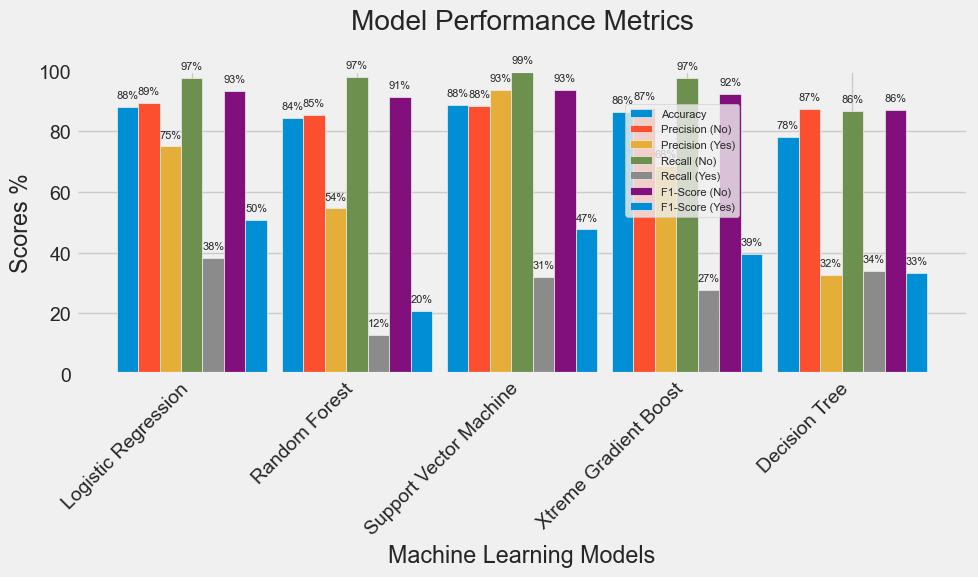

In [98]:
import matplotlib.pyplot as plt
import numpy as np

# Set a fixed random seed
np.random.seed(42)

# Define the models
models = {
    'Logistic Regression': LogisticRegression(solver='liblinear', penalty='l1'),
    'Random Forest': RandomForestClassifier(n_estimators=100),
    'Support Vector Machine': SVC(kernel='linear'),
    'Xtreme Gradient Boost': XGBClassifier(),
    'Decision Tree': DecisionTreeClassifier(),
}

# Create empty lists to store the results for each metric
accuracy_scores = []
precision_no_scores = []
precision_yes_scores = []
recall_no_scores = []
recall_yes_scores = []
f1_score_no_scores = []
f1_score_yes_scores = []

# Calculate performance metrics for each model
for model_name, model in models.items():
    model.fit(X_train_scaled, y_train)
    y_pred = model.predict(X_test_scaled)
    accuracy_scores.append(accuracy_score(y_test, y_pred) * 100)
    precision_no_scores.append(precision_score(y_test, y_pred, pos_label=0) * 100)
    precision_yes_scores.append(precision_score(y_test, y_pred, pos_label=1) * 100)
    recall_no_scores.append(recall_score(y_test, y_pred, pos_label=0) * 100)
    recall_yes_scores.append(recall_score(y_test, y_pred, pos_label=1) * 100)
    f1_score_no_scores.append(f1_score(y_test, y_pred, pos_label=0) * 100)
    f1_score_yes_scores.append(f1_score(y_test, y_pred, pos_label=1) * 100)

# Create the figure and axis
fig, ax = plt.subplots(figsize=(10, 6))

# Plot the performance metrics for each model
bar_width = 0.13
index = np.arange(len(models))
bars_accuracy = ax.bar(index, accuracy_scores, bar_width, label='Accuracy', align='center')
bars_precision_no = ax.bar(index + bar_width, precision_no_scores, bar_width, label='Precision (No)', align='center')
bars_precision_yes = ax.bar(index + 2 * bar_width, precision_yes_scores, bar_width, label='Precision (Yes)', align='center')
bars_recall_no = ax.bar(index + 3 * bar_width, recall_no_scores, bar_width, label='Recall (No)', align='center')
bars_recall_yes = ax.bar(index + 4 * bar_width, recall_yes_scores, bar_width, label='Recall (Yes)', align='center')
bars_f1_no = ax.bar(index + 5 * bar_width, f1_score_no_scores, bar_width, label='F1-Score (No)', align='center')
bars_f1_yes = ax.bar(index + 6 * bar_width, f1_score_yes_scores, bar_width, label='F1-Score (Yes)', align='center')

# Add the scores above each bar
def autolabel(bars):
    for bar in bars:
        height = bar.get_height()
        ax.annotate(f'{int(height)}%', xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 5), textcoords='offset points',
                    ha='center', va='bottom', fontsize=8)

# Call the autolabel function for each group of bars
autolabel(bars_accuracy)
autolabel(bars_precision_no)
autolabel(bars_precision_yes)
autolabel(bars_recall_no)
autolabel(bars_recall_yes)
autolabel(bars_f1_no)
autolabel(bars_f1_yes)

# Set the title and adjust the space between the title and the bars
plt.title('Model Performance Metrics', pad=30)

# Set the x-axis ticks and labels
ax.set_xticks(index + 3 * bar_width)
ax.set_xticklabels(list(models.keys()), rotation=45, ha='right')

# Set labels, title, and legend
plt.xlabel('Machine Learning Models')
plt.ylabel('Scores %')
ax.set_ylim(0, 100)

# Customize the legend
ax.legend(bbox_to_anchor=(0.75, 0.5), loc='lower right', fontsize='8')

# Save and display the plot
plt.tight_layout()
plt.savefig('model_performance.png', dpi=300, bbox_inches='tight')
plt.show()

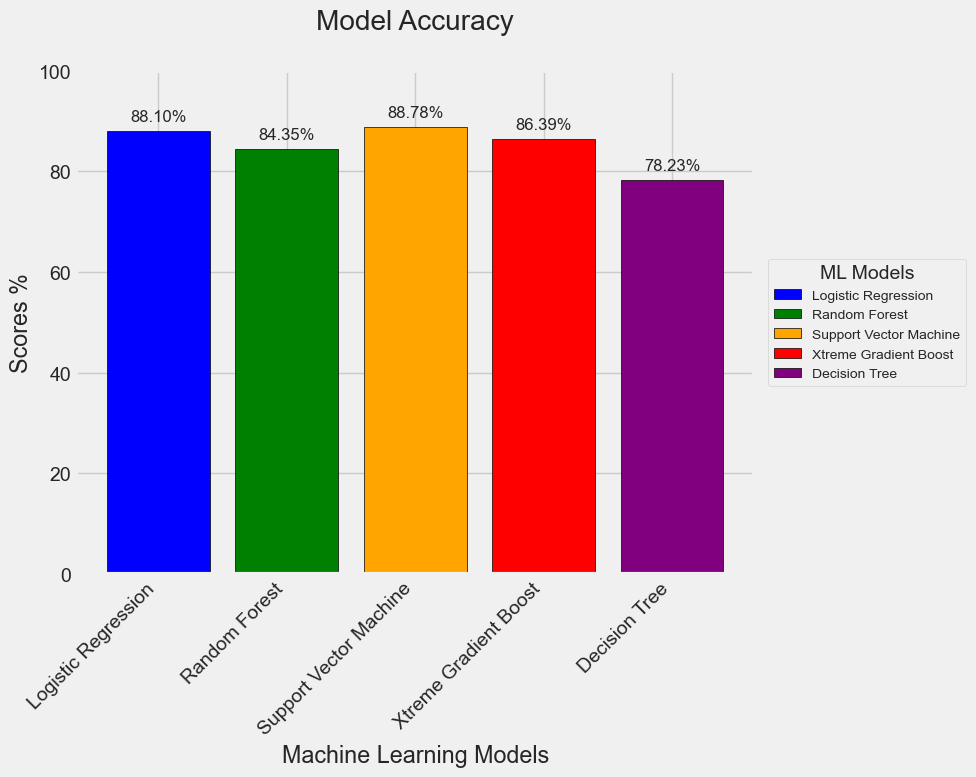

In [107]:
import matplotlib.pyplot as plt
import numpy as np

# Set a fixed random seed
np.random.seed(42)

# Define the models and their corresponding accuracy scores
models = {
    'Logistic Regression': LogisticRegression(solver='liblinear', penalty='l1'),
    'Random Forest': RandomForestClassifier(n_estimators=100),
    'Support Vector Machine': SVC(kernel='linear'),
    'Xtreme Gradient Boost': XGBClassifier(),
    'Decision Tree': DecisionTreeClassifier(),
}

# Create empty lists to store the results for each metric
accuracy_scores = []

# Create the figure and axis
fig, ax = plt.subplots(figsize=(10, 8))

# Calculate performance metrics for each model
for model_name, model in models.items():
    model.fit(X_train_scaled, y_train)
    y_pred = model.predict(X_test_scaled)
    accuracy_scores.append(accuracy_score(y_test, y_pred) * 100)

# Define the model names for x-axis labels
model_names = list(models.keys())

# Set the colors, rotation, and edge color for the bars
bar_colors = ['blue', 'green', 'orange', 'red', 'purple']
plt.xticks(rotation=45, ha='right')
edge_color = 'black'

# Plot the accuracy scores for each model
bars = ax.bar(model_names, accuracy_scores, color=bar_colors, edgecolor=edge_color)

# Add the accuracy values above each bar with 2 significant figures
def autolabel(bars):
    for bar in bars:
        height = bar.get_height()
        ax.annotate(f'{height:.2f}%', xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 5), textcoords='offset points',
                    ha='center', va='bottom', fontsize=12)

# Call the autolabel function to add accuracy values above each bar
autolabel(bars)

# Set the title and adjust the space between the title and the bars
plt.title('Model Accuracy', pad=30)

plt.ylabel('Scores %')
plt.xlabel('Machine Learning Models')

# Set the y-axis limit to 0-100
ax.set_ylim(0, 100)

# Customize the legend and place it at the lower right
ax.legend(bars, model_names, bbox_to_anchor=(1.01, 0.5), loc='center left', fontsize='10', title='ML Models')

# Save and display the plot
plt.tight_layout()
plt.savefig('model_accuracy.png', dpi=300, bbox_inches='tight')
plt.show()

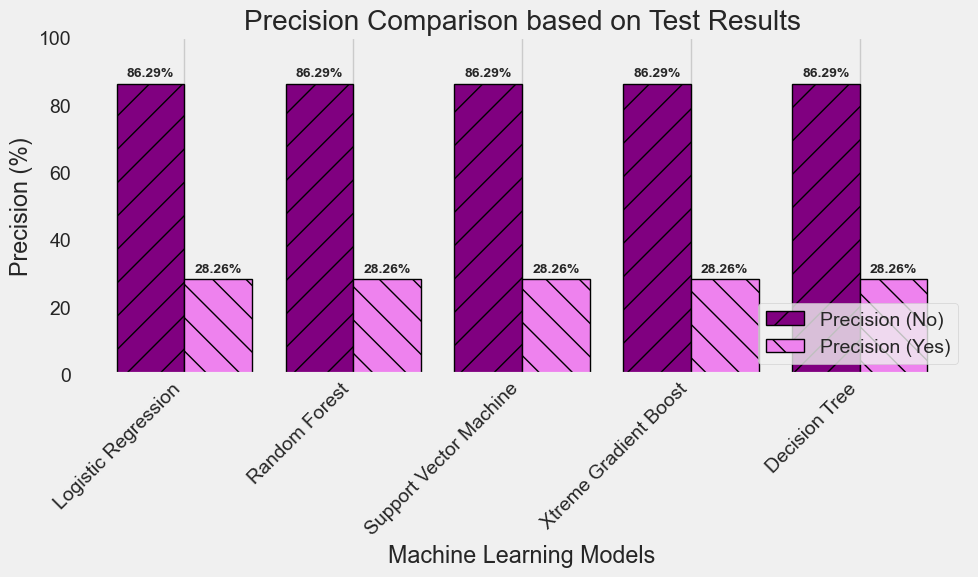

In [100]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report

# Define the models
models = {
    'Logistic Regression': LogisticRegression(solver='liblinear', penalty='l1'),
    'Random Forest': RandomForestClassifier(n_estimators=100),
    'Support Vector Machine': SVC(kernel='linear'),
    'Xtreme Gradient Boost': XGBClassifier(),
    'Decision Tree': DecisionTreeClassifier(),
}

# Create empty lists to store the precision values for 'No' and 'Yes'
precision_no_list = []
precision_yes_list = []

# Evaluate each model and store the precision values in the lists
for model_name, model in models.items():
    model.fit(X_train_scaled, y_train)
    y_pred = model.predict(X_test_scaled)
    report = classification_report(y_test, y_test_pred, output_dict=True)
    precision_no_list.append(report['0']['precision'] * 100)
    precision_yes_list.append(report['1']['precision'] * 100)

# Colors for 'No' and 'Yes' bars
color_no = 'purple'
color_yes = 'violet'

# Plot the bar chart
plt.figure(figsize=(10, 6))  # Adjust the figure size
bar_width = 0.4

# Set positions for the bars
positions = range(len(models))

# Plot the bars for Precision 'No' and 'Yes' with custom colors
bars1 = plt.bar(positions, precision_no_list, bar_width, label='Precision (No)', align='center', alpha=1.0, color=color_no, edgecolor='black', linewidth=1, hatch='/', zorder=2)
bars2 = plt.bar([pos + bar_width for pos in positions], precision_yes_list, bar_width, label='Precision (Yes)', align='center', alpha=1.0, color=color_yes, edgecolor='black', linewidth=1, hatch='\\', zorder=2)

# Set the x-axis labels to be the model names
plt.xticks([pos + bar_width/2 for pos in positions], models.keys(), rotation=45, ha='right')

plt.xlabel('Machine Learning Models')
plt.ylabel('Precision (%)')
plt.title('Precision Comparison based on Test Results')
plt.legend(loc='lower right')
plt.grid(axis='y')

def autolabel(bars):
    for bar in bars:
        height = bar.get_height()
        plt.annotate(f'{height:.2f}%', xy=(bar.get_x() + bar.get_width() / 2, height),
                     xytext=(0, 3), textcoords='offset points',
                     ha='center', va='bottom', fontsize=10, fontweight='bold')
autolabel(bars1)
autolabel(bars2)

plt.ylim(0, 100)

plt.tight_layout()
plt.show()

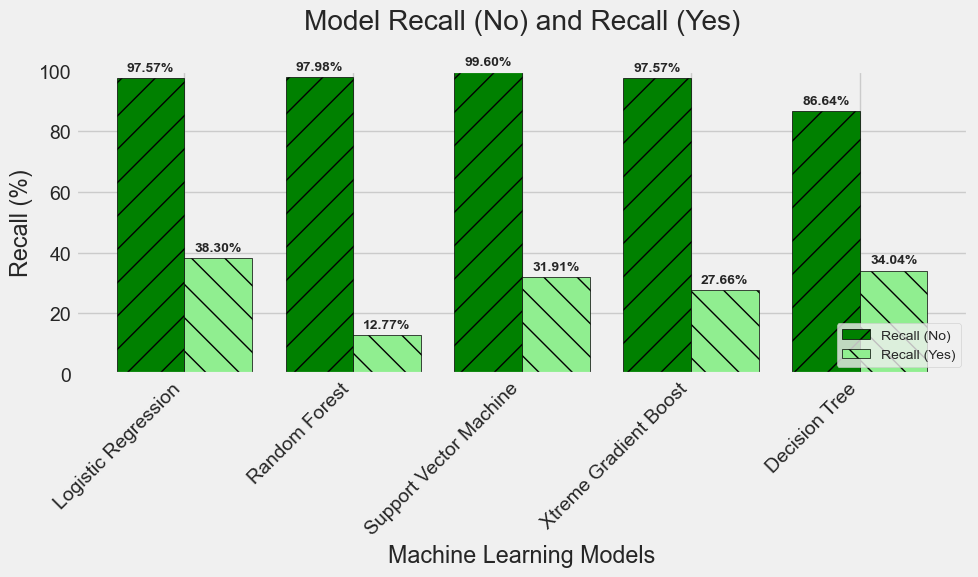

In [101]:
import matplotlib.pyplot as plt
import numpy as np

# Set a fixed random seed
np.random.seed(42)

# Define the models
models = {
    'Logistic Regression': LogisticRegression(solver='liblinear', penalty='l1'),
    'Random Forest': RandomForestClassifier(n_estimators=100),
    'Support Vector Machine': SVC(kernel='linear'),
    'Xtreme Gradient Boost': XGBClassifier(),
    'Decision Tree': DecisionTreeClassifier(),
}

# Create empty lists to store the results for Recall (No) and Recall (Yes) for each model
recall_no_scores = []
recall_yes_scores = []

# Calculate performance metrics for each model
for model_name, model in models.items():
    model.fit(X_train_scaled, y_train)
    y_pred = model.predict(X_test_scaled)
    recall_no_scores.append(recall_score(y_test, y_pred, pos_label=0) * 100)
    recall_yes_scores.append(recall_score(y_test, y_pred, pos_label=1) * 100)

# Create the figure and axis
fig, ax = plt.subplots(figsize=(10, 6))

# Plot the Recall (No) scores for each model
bar_width = 0.4
index = np.arange(len(models))
bars_recall_no = ax.bar(index, recall_no_scores, bar_width, label='Recall (No)', align='center', color='green', edgecolor='black', hatch='/', zorder=2)

# Plot the Recall (Yes) scores for each model
bars_recall_yes = ax.bar(index + bar_width, recall_yes_scores, bar_width, label='Recall (Yes)', align='center', color='lightgreen', edgecolor='black', hatch='\\', zorder=2)

# Add the scores above each bar
def autolabel(bars):
    for bar in bars:
        height = bar.get_height()
        plt.annotate(f'{height:.2f}%', xy=(bar.get_x() + bar.get_width() / 2, height),
                     xytext=(0, 3), textcoords='offset points',
                     ha='center', va='bottom', fontsize=10, fontweight='bold')

# Call the autolabel function for each group of bars
autolabel(bars_recall_no)
autolabel(bars_recall_yes)

# Set the title and adjust the space between the title and the bars
plt.title('Model Recall (No) and Recall (Yes)', pad=30)

# Set the x-axis ticks and labels
ax.set_xticks(index + bar_width / 2)
ax.set_xticklabels(list(models.keys()), rotation=45, ha='right')

# Set labels, title, and legend
plt.xlabel('Machine Learning Models')
plt.ylabel('Recall (%)')
ax.set_ylim(0, 100)
plt.legend(loc='lower right', fontsize='10')

# Save and display the plot
plt.tight_layout()
plt.savefig('model_recall.png', dpi=300, bbox_inches='tight')
plt.show()

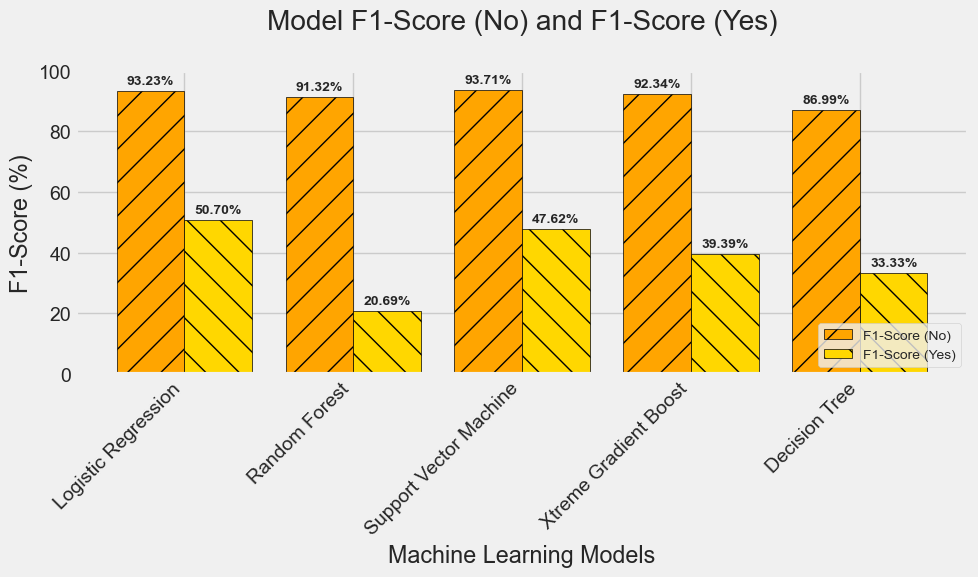

In [102]:
import matplotlib.pyplot as plt
import numpy as np

# Set a fixed random seed
np.random.seed(42)

# Define the models
models = {
    'Logistic Regression': LogisticRegression(solver='liblinear', penalty='l1'),
    'Random Forest': RandomForestClassifier(n_estimators=100),
    'Support Vector Machine': SVC(kernel='linear'),
    'Xtreme Gradient Boost': XGBClassifier(),
    'Decision Tree': DecisionTreeClassifier(),
}

# Create empty lists to store the results for F1-score (No) and F1-score (Yes) for each model
f1_score_no_scores = []
f1_score_yes_scores = []

# Calculate performance metrics for each model
for model_name, model in models.items():
    model.fit(X_train_scaled, y_train)
    y_pred = model.predict(X_test_scaled)
    f1_score_no_scores.append(f1_score(y_test, y_pred, pos_label=0) * 100)
    f1_score_yes_scores.append(f1_score(y_test, y_pred, pos_label=1) * 100)

# Create the figure and axis
fig, ax = plt.subplots(figsize=(10, 6))

# Plot the F1-score (No) scores for each model
bar_width = 0.4
index = np.arange(len(models))
bars_f1_no = ax.bar(index, f1_score_no_scores, bar_width, label='F1-Score (No)', align='center', color='orange', edgecolor='black', hatch='/', zorder=2)

# Plot the F1-score (Yes) scores for each model
bars_f1_yes = ax.bar(index + bar_width, f1_score_yes_scores, bar_width, label='F1-Score (Yes)', align='center', color='gold', edgecolor='black', hatch='\\', zorder=2)

# Add the scores above each bar
def autolabel(bars):
    for bar in bars:
        height = bar.get_height()
        plt.annotate(f'{height:.2f}%', xy=(bar.get_x() + bar.get_width() / 2, height),
                     xytext=(0, 3), textcoords='offset points',
                     ha='center', va='bottom', fontsize=10, fontweight='bold')

# Call the autolabel function for each group of bars
autolabel(bars_f1_no)
autolabel(bars_f1_yes)

# Set the title and adjust the space between the title and the bars
plt.title('Model F1-Score (No) and F1-Score (Yes)', pad=30)

# Set the x-axis ticks and labels
ax.set_xticks(index + bar_width / 2)
ax.set_xticklabels(list(models.keys()), rotation=45, ha='right')

# Set labels, title, and legend
plt.xlabel('Machine Learning Models')
plt.ylabel('F1-Score (%)')
ax.set_ylim(0, 100)
plt.legend(loc='lower right', fontsize='10')

# Save and display the plot
plt.tight_layout()
plt.savefig('model_f1_score.png', dpi=300, bbox_inches='tight')
plt.show()

### Cross Validation of Machine Learning Models

In [103]:
import numpy as np
from sklearn.metrics import make_scorer, f1_score
from sklearn.model_selection import cross_val_score

# Define the F1-score as a scorer
f1_scorer = make_scorer(f1_score)

# Cross validation metric
def CVM(model, model_name):
    print(f"Model: {model_name}")
    scores = ['accuracy', 'precision', 'recall', f1_scorer]
    for sc in scores:
        scores = cross_val_score(model, X, y, cv=5, scoring=sc, error_score='raise', n_jobs=-1)
        print(f'[{sc}] : {np.mean(scores):.5f} (+/- {np.std(scores):.5f})')
    print()

#Cross validation score
CVM(lgr_model, 'Logistic Regression')
CVM(rf_model, 'Random Forest')
CVM(svm_model, 'Support Vector Machine')
CVM(xgb_model, 'Xtreme Gradient Boost')
CVM(dt_model, 'Decision Tree')

Model: Logistic Regression
[accuracy] : 0.86531 (+/- 0.01130)
[precision] : 0.67904 (+/- 0.08456)
[recall] : 0.32057 (+/- 0.04373)
[make_scorer(f1_score)] : 0.43341 (+/- 0.05004)

Model: Random Forest
[accuracy] : 0.85714 (+/- 0.00569)
[precision] : 0.77030 (+/- 0.07200)
[recall] : 0.16463 (+/- 0.03623)
[make_scorer(f1_score)] : 0.26913 (+/- 0.05182)

Model: Support Vector Machine
[accuracy] : 0.85034 (+/- 0.01652)
[precision] : 0.61964 (+/- 0.16878)
[recall] : 0.18945 (+/- 0.05353)
[make_scorer(f1_score)] : 0.28969 (+/- 0.08062)

Model: Xtreme Gradient Boost
[accuracy] : 0.86735 (+/- 0.00986)
[precision] : 0.69621 (+/- 0.05984)
[recall] : 0.32119 (+/- 0.08332)
[make_scorer(f1_score)] : 0.43222 (+/- 0.08025)

Model: Decision Tree
[accuracy] : 0.78435 (+/- 0.02211)
[precision] : 0.35617 (+/- 0.04977)
[recall] : 0.40106 (+/- 0.03239)
[make_scorer(f1_score)] : 0.37612 (+/- 0.03737)



In [104]:
import pandas as pd
from tabulate import tabulate

# Define the model names
model_names = [
    'Logistic Regression',
    'Random Forest',
    'Support Vector Machine',
    'Xtreme Gradient Boost',
    'Decision Tree',
]

# Define the results as a list of dictionaries
results = [
    {
        'S/N': '1.',
        'Model': 'Logistic Regression',
        'Accuracy': 0.86463,
        'Precision': 0.67350,
        'Recall': 0.32057,
        'F1-score': 0.43225
    },
    {
        'S/N': '2.',
        'Model': 'Random Forest',
        'Accuracy': 0.85714,
        'Precision': 0.77030,
        'Recall': 0.16463,
        'F1-score': 0.26913
    },
    {
        'S/N': '3.',
        'Model': 'Support Vector Machine',
        'Accuracy': 0.85034,
        'Precision': 0.61964,
        'Recall': 0.18945,
        'F1-score': 0.28969
    },
    {
        'S/N': '4.',
        'Model': 'Xtreme Gradient Boost',
        'Accuracy': 0.86735,
        'Precision': 0.69621,
        'Recall': 0.32119,
        'F1-score': 0.43222
    },
    {
        'S/N': '5.',
        'Model': 'Decision Tree',
        'Accuracy': 0.78435,
        'Precision': 0.35617,
        'Recall': 0.40106,
        'F1-score': 0.37612
    }
]

# Create a DataFrame from the results
results_df = pd.DataFrame(results)

# Format numeric columns to 3 decimal places
results_df[['Accuracy', 'Precision', 'Recall', 'F1-score']] = results_df[['Accuracy', 'Precision', 'Recall', 'F1-score']].applymap(lambda x: f'{x:.3f}')

# Define the headers for the tabulate function
headers = ['S/N', 'Model', 'Accuracy', 'Precision', 'Recall', 'F1-score']

# Display the DataFrame using tabulate with left alignment for the Model column
print(tabulate(results_df, headers=headers, tablefmt='pretty', showindex=False, numalign="left", colalign=("right", "left", "right", "right", "right", "right")))

+-----+------------------------+----------+-----------+--------+----------+
| S/N | Model                  | Accuracy | Precision | Recall | F1-score |
+-----+------------------------+----------+-----------+--------+----------+
|  1. | Logistic Regression    |    0.865 |     0.673 |  0.321 |    0.432 |
|  2. | Random Forest          |    0.857 |     0.770 |  0.165 |    0.269 |
|  3. | Support Vector Machine |    0.850 |     0.620 |  0.189 |    0.290 |
|  4. | Xtreme Gradient Boost  |    0.867 |     0.696 |  0.321 |    0.432 |
|  5. | Decision Tree          |    0.784 |     0.356 |  0.401 |    0.376 |
+-----+------------------------+----------+-----------+--------+----------+


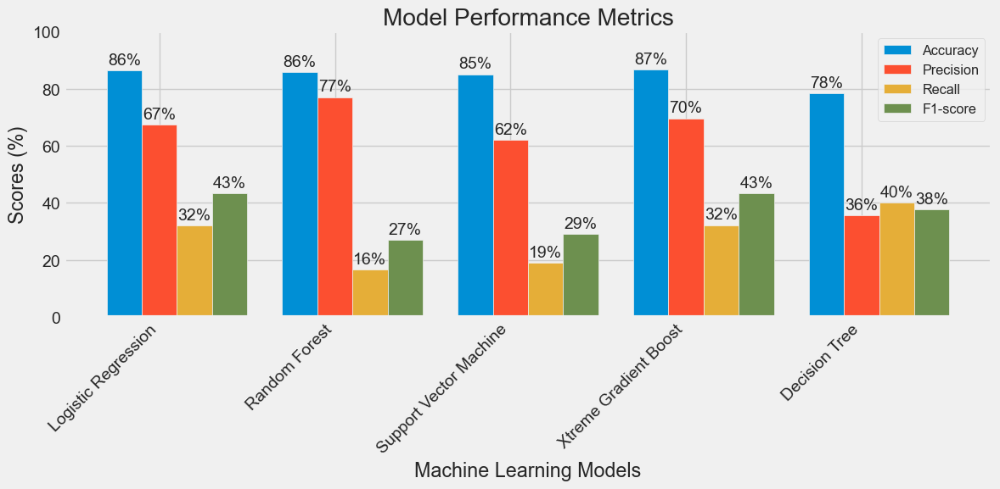

In [105]:
import matplotlib.pyplot as plt
import numpy as np

# Define the model names
model_names = [
    'Logistic Regression',
    'Random Forest',
    'Support Vector Machine',
    'Xtreme Gradient Boost',
    'Decision Tree',
]

# Define the results as a list of dictionaries
results = [
    {
        'Model': 'Logistic Regression',
        'Accuracy': 0.86463,
        'Precision': 0.67350,
        'Recall': 0.32057,
        'F1-score': 0.43225
    },
    {
        'Model': 'Random Forest',
        'Accuracy': 0.85714,
        'Precision': 0.77030,
        'Recall': 0.16463,
        'F1-score': 0.26913
    },
    {
        'Model': 'Support Vector Machine',
        'Accuracy': 0.85034,
        'Precision': 0.61964,
        'Recall': 0.18945,
        'F1-score': 0.28969
    },
    {
        'Model': 'Xtreme Gradient Boost',
        'Accuracy': 0.86735,
        'Precision': 0.69621,
        'Recall': 0.32119,
        'F1-score': 0.43222
    },
    {
        'Model': 'Decision Tree',
        'Accuracy': 0.78435,
        'Precision': 0.35617,
        'Recall': 0.40106,
        'F1-score': 0.37612
    }
]

# Create a DataFrame from the results
results_df = pd.DataFrame(results)

# Set the figure size
plt.figure(figsize=(12, 6))

# Set the positions for the bars
positions = np.arange(len(model_names))

# Plot the bars for each metric (Accuracy, Precision, Recall, F1-score)
metrics = ['Accuracy', 'Precision', 'Recall', 'F1-score']
bar_width = 0.2

for i, metric in enumerate(metrics):
    # Calculate the values to be plotted
    values = results_df[metric] * 100
    rounded_values = np.round(values)
    
    # Plot the bars side by side
    plt.bar(positions + (i * bar_width), values, width=bar_width, label=metric)

    # Add the values at the top of each bar
    for x, y in zip(positions + (i * bar_width), values):
        plt.text(x, y + 1, f'{int(np.round(y))}%', ha='center', va='bottom')

# Set the x-axis labels to be the model names
plt.xticks(positions + bar_width, model_names, rotation=45, ha='right')

# Set the y-axis limit to 0-100
plt.ylim(0, 100)

# Set labels, title, and legend
plt.xlabel('Machine Learning Models')
plt.ylabel('Scores (%)')
plt.title('Model Performance Metrics')
plt.legend(loc='upper right', fontsize='small')

plt.tight_layout()
plt.show()
